# Getting Dataset

In [87]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm
import problem_unittests as tests
import tarfile
import pickle
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelBinarizer

## Path

In [88]:
cifar10_dataset_folder_path = 'cifar-10-batches-py'

# Use Floyd's cifar-10 dataset if present
floyd_cifar10_location = '/input/cifar-10/python.tar.gz'
if isfile(floyd_cifar10_location):
    tar_gz_path = floyd_cifar10_location
else:
    tar_gz_path = 'cifar-10-python.tar.gz'

In [89]:
class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(tar_gz_path):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='CIFAR-10 Dataset') as pbar:
        urlretrieve(
            'https://www.cs.toronto.edu/~kriz/cifar-10-python.tar.gz',
            tar_gz_path,
            pbar.hook)

if not isdir(cifar10_dataset_folder_path):
    with tarfile.open(tar_gz_path) as tar:
        tar.extractall()
        tar.close()


tests.test_folder_path(cifar10_dataset_folder_path)

All files found!


## Explore the Data
The dataset is broken into batches to prevent your machine from running out of memory.  The CIFAR-10 dataset consists of 5 batches, named `data_batch_1`, `data_batch_2`, etc.. Each batch contains the labels and images that are one of the following:
* airplane
* automobile
* bird
* cat
* deer
* dog
* frog
* horse
* ship
* truck

Understanding a dataset is part of making predictions on the data.  Play around with the code cell below by changing the `batch_id` and `sample_id`. The `batch_id` is the id for a batch (1-5). The `sample_id` is the id for a image and label pair in the batch.

Ask yourself "What are all possible labels?", "What is the range of values for the image data?", "Are the labels in order or random?".  Answers to questions like these will help you preprocess the data and end up with better predictions.


Stats of batch 5:
Samples: 10000
Label Counts: {0: 1014, 1: 1014, 2: 952, 3: 1016, 4: 997, 5: 1025, 6: 980, 7: 977, 8: 1003, 9: 1022}
First 20 Labels: [1, 8, 5, 1, 5, 7, 4, 3, 8, 2, 7, 2, 0, 1, 5, 9, 6, 2, 0, 8]

Example of Image 669:
Image - Min Value: 2 Max Value: 255
Image - Shape: (32, 32, 3)
Label - Label Id: 8 Name: ship


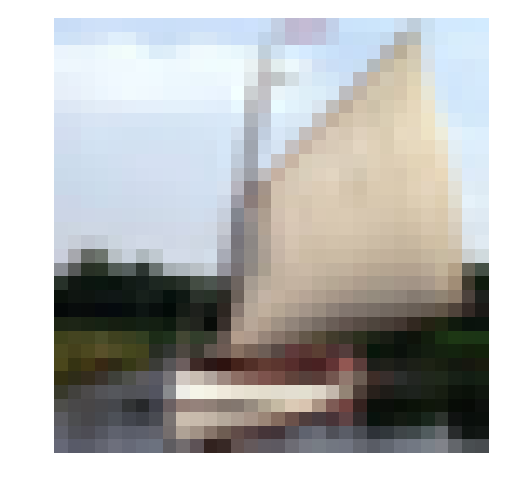

In [90]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import helper
import numpy as np

# Explore the dataset
batch_id = 5
sample_id = 669
helper.display_stats(cifar10_dataset_folder_path, batch_id, sample_id)

In [91]:
def display_stats(cifar10_dataset_folder_path, batch_id, sample_id):
    """
    Display Stats of the the dataset
    """
    batch_ids = list(range(1, 6))

    if batch_id not in batch_ids:
        print('Batch Id out of Range. Possible Batch Ids: {}'.format(batch_ids))
        return None

    features, labels = load_cfar10_batch(cifar10_dataset_folder_path, batch_id)

    if not (0 <= sample_id < len(features)):
        print('{} samples in batch {}.  {} is out of range.'.format(len(features), batch_id, sample_id))
        return None

    print('\nStats of batch {}:'.format(batch_id))
    print('Samples: {}'.format(len(features)))
    print('Label Counts: {}'.format(dict(zip(*np.unique(labels, return_counts=True)))))
    print('First 20 Labels: {}'.format(labels[:20]))

    sample_image = features[sample_id]
    sample_label = labels[sample_id]
    label_names = _load_label_names()

    print('\nExample of Image {}:'.format(sample_id))
    print('Image - Min Value: {} Max Value: {}'.format(sample_image.min(), sample_image.max()))
    print('Image - Shape: {}'.format(sample_image.shape))
    print('Label - Label Id: {} Name: {}'.format(sample_label, label_names[sample_label]))
    plt.axis('off')
    plt.imshow(sample_image)

In [92]:
batch_ids = list(range(1, 6))
batch_ids

[1, 2, 3, 4, 5]

In [93]:
def load_cfar10_batch(cifar10_dataset_folder_path, batch_id):
    """
    Load a batch of the dataset
    """
    with open(cifar10_dataset_folder_path + '/data_batch_' + str(batch_id), mode='rb') as file:
        batch = pickle.load(file, encoding='latin1')

    features = batch['data'].reshape((len(batch['data']), 3, 32, 32)).transpose(0, 2, 3, 1)
    labels = batch['labels']

    return features, labels

In [94]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelBinarizer

with open(cifar10_dataset_folder_path + '/data_batch_' + str(batch_id), mode='rb') as file:
        batch = pickle.load(file, encoding='latin1')
        
batch

{'batch_label': 'training batch 5 of 5',
 'data': array([[255, 252, 253, ..., 173, 231, 248],
        [127, 126, 127, ..., 102, 108, 112],
        [116,  64,  19, ...,   7,   6,   5],
        ..., 
        [ 35,  40,  42, ...,  77,  66,  50],
        [189, 186, 185, ..., 169, 171, 171],
        [229, 236, 234, ..., 173, 162, 161]], dtype=uint8),
 'filenames': ['compact_car_s_001706.png',
  'icebreaker_s_001689.png',
  'peke_s_000545.png',
  'convertible_s_000520.png',
  'domestic_dog_s_000455.png',
  'broodmare_s_000313.png',
  'capreolus_capreolus_s_001380.png',
  'true_cat_s_000886.png',
  'cruiser_s_000163.png',
  'ostrich_s_001561.png',
  'buckskin_s_000031.png',
  'cassowary_s_002024.png',
  'fighter_aircraft_s_001009.png',
  'convertible_s_000295.png',
  'lapdog_s_001489.png',
  'delivery_truck_s_001300.png',
  'rana_pipiens_s_000379.png',
  'ostrich_s_000026.png',
  'fighter_aircraft_s_000720.png',
  'supertanker_s_000275.png',
  'ostrich_s_000147.png',
  'male_horse_s_000742.pn

In [95]:
batch['data']

array([[255, 252, 253, ..., 173, 231, 248],
       [127, 126, 127, ..., 102, 108, 112],
       [116,  64,  19, ...,   7,   6,   5],
       ..., 
       [ 35,  40,  42, ...,  77,  66,  50],
       [189, 186, 185, ..., 169, 171, 171],
       [229, 236, 234, ..., 173, 162, 161]], dtype=uint8)

In [96]:
print ( "shape of the data of the batch : ", batch['data'].shape)
print ( "type of the batch['data']   :", type(batch['data']), "dimension of the batch['data'] : ",batch['data'].ndim)
print ( "shape of the original single record of the batch : ", batch['data'][1].shape, 
      " : single array of 32*32*3 ") 
print ( batch['data'][1])
print ( type(batch['data'][1]))

shape of the data of the batch :  (10000, 3072)
type of the batch['data']   : <class 'numpy.ndarray'> dimension of the batch['data'] :  2
shape of the original single record of the batch :  (3072,)  : single array of 32*32*3 
[127 126 127 ..., 102 108 112]
<class 'numpy.ndarray'>


#### make the (10000,3072) into (10000,32,32,3)

In [97]:
batch['data'].reshape((len(batch['data']), 3, 32, 32))

array([[[[255, 252, 253, ..., 165, 243, 254],
         [255, 252, 254, ..., 130, 225, 253],
         [255, 254, 248, ..., 141, 220, 253],
         ..., 
         [233, 216, 241, ...,   9,  18, 169],
         [255, 255, 253, ...,  21, 113, 235],
         [255, 251, 253, ..., 172, 230, 247]],

        [[255, 252, 252, ..., 177, 246, 253],
         [255, 252, 254, ..., 144, 232, 255],
         [255, 254, 247, ..., 155, 227, 255],
         ..., 
         [234, 216, 241, ...,  11,  19, 171],
         [255, 255, 253, ...,  23, 115, 237],
         [255, 251, 253, ..., 174, 232, 248]],

        [[254, 252, 254, ..., 184, 247, 252],
         [254, 252, 255, ..., 161, 239, 255],
         [255, 254, 249, ..., 175, 235, 255],
         ..., 
         [234, 216, 241, ...,  11,  19, 170],
         [255, 255, 253, ...,  22, 114, 236],
         [255, 251, 253, ..., 173, 231, 248]]],


       [[[127, 126, 127, ..., 125, 125, 124],
         [125, 125, 126, ..., 125, 124, 124],
         [126, 124, 126, ..

In [98]:
batch['data'].reshape((len(batch['data']), 3, 32, 32)).transpose(0, 2, 3, 1)

array([[[[255, 255, 254],
         [252, 252, 252],
         [253, 252, 254],
         ..., 
         [165, 177, 184],
         [243, 246, 247],
         [254, 253, 252]],

        [[255, 255, 254],
         [252, 252, 252],
         [254, 254, 255],
         ..., 
         [130, 144, 161],
         [225, 232, 239],
         [253, 255, 255]],

        [[255, 255, 255],
         [254, 254, 254],
         [248, 247, 249],
         ..., 
         [141, 155, 175],
         [220, 227, 235],
         [253, 255, 255]],

        ..., 
        [[233, 234, 234],
         [216, 216, 216],
         [241, 241, 241],
         ..., 
         [  9,  11,  11],
         [ 18,  19,  19],
         [169, 171, 170]],

        [[255, 255, 255],
         [255, 255, 255],
         [253, 253, 253],
         ..., 
         [ 21,  23,  22],
         [113, 115, 114],
         [235, 237, 236]],

        [[255, 255, 255],
         [251, 251, 251],
         [253, 253, 253],
         ..., 
         [172, 174, 173],
  

In [99]:
features = batch['data'].reshape((len(batch['data']), 3, 32, 32)).transpose(0, 2, 3, 1)
print( "features are in shape of : ", features.shape , "and type of : ", type(features))

features are in shape of :  (10000, 32, 32, 3) and type of :  <class 'numpy.ndarray'>


In [100]:
print(batch['labels'])
print( "labels are in length of :", len(batch['labels']),"and in type of : ", type(batch['labels']))


[1, 8, 5, 1, 5, 7, 4, 3, 8, 2, 7, 2, 0, 1, 5, 9, 6, 2, 0, 8, 2, 7, 0, 4, 1, 7, 7, 4, 4, 9, 9, 6, 2, 4, 1, 6, 4, 9, 6, 6, 9, 6, 9, 9, 5, 7, 1, 6, 8, 2, 9, 5, 9, 5, 3, 7, 1, 3, 3, 9, 1, 7, 8, 9, 7, 4, 3, 4, 9, 5, 8, 4, 9, 3, 6, 1, 1, 4, 3, 9, 9, 1, 9, 9, 2, 4, 3, 2, 4, 7, 1, 5, 1, 8, 6, 3, 6, 3, 4, 4, 9, 9, 9, 7, 0, 5, 7, 7, 4, 8, 8, 4, 2, 0, 5, 2, 4, 9, 1, 7, 7, 4, 8, 8, 8, 0, 2, 3, 6, 3, 9, 0, 8, 2, 2, 4, 8, 8, 1, 8, 5, 7, 6, 0, 9, 1, 4, 8, 2, 1, 0, 5, 1, 6, 5, 3, 4, 9, 9, 0, 3, 5, 4, 2, 6, 3, 9, 4, 9, 8, 6, 4, 1, 1, 9, 8, 2, 2, 1, 8, 5, 9, 7, 8, 1, 1, 4, 2, 4, 2, 0, 8, 8, 0, 0, 4, 3, 0, 7, 7, 6, 1, 6, 7, 1, 5, 6, 1, 7, 2, 4, 0, 2, 2, 5, 9, 3, 2, 1, 4, 1, 2, 9, 8, 5, 2, 3, 3, 4, 9, 7, 2, 3, 9, 7, 6, 2, 9, 7, 5, 4, 0, 8, 7, 2, 0, 3, 5, 1, 3, 1, 7, 8, 7, 9, 8, 2, 9, 1, 4, 8, 6, 7, 3, 6, 9, 7, 9, 4, 5, 8, 0, 5, 6, 6, 0, 8, 4, 6, 1, 4, 2, 2, 1, 8, 4, 4, 0, 2, 4, 1, 9, 8, 9, 0, 7, 1, 1, 6, 4, 7, 4, 6, 9, 3, 2, 7, 3, 7, 4, 5, 1, 9, 6, 3, 9, 6, 0, 7, 0, 0, 0, 6, 6, 9, 7, 3, 2, 0, 6, 7, 5, 0, 

In [125]:
labels = batch['labels']

In [126]:
features.shape

(10000, 32, 32, 3)

In [127]:
type(labels)

list

# Step 2 : Normalizing input and one hot encoding output

In [104]:
def normalize(x):
    return x/255.0

from sklearn import preprocessing

def one_hot_encode(x):
    lb = preprocessing.LabelBinarizer()
    lb.fit([0,1,2,3,4,5,6,7,8,9])
    result = lb.transform(x)
    return result

In [105]:
lb = preprocessing.LabelBinarizer()
preprocessing.LabelBinarizer?

In [106]:
x = lb.fit(labels)
x

LabelBinarizer(neg_label=0, pos_label=1, sparse_output=False)

In [107]:
lb.classes_

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [108]:
lb.transform(labels)

array([[0, 1, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 1, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ..., 
       [0, 0, 0, ..., 0, 0, 1],
       [0, 1, 0, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 0]])

# Step 3. Preprocessing and Saving the data

In [109]:
helper.preprocess_and_save_data(cifar10_dataset_folder_path, normalize, one_hot_encode)

In [110]:
def preprocess_and_save_data(cifar10_dataset_folder_path, normalize, one_hot_encode):
    """
    Preprocess Training and Validation Data
    """
    n_batches = 5
    valid_features = []
    valid_labels = []

    for batch_i in range(1, n_batches + 1):
        features, labels = load_cfar10_batch(cifar10_dataset_folder_path, batch_i)
        validation_count = int(len(features) * 0.1)

        # Prprocess and save a batch of training data
        _preprocess_and_save(
            normalize,
            one_hot_encode,
            features[:-validation_count],
            labels[:-validation_count],
            'preprocess_batch_' + str(batch_i) + '.p')

        # Use a portion of training batch for validation
        valid_features.extend(features[-validation_count:])
        valid_labels.extend(labels[-validation_count:])

    # Preprocess and Save all validation data
    _preprocess_and_save(
        normalize,
        one_hot_encode,
        np.array(valid_features),
        np.array(valid_labels),
        'preprocess_validation.p')

    with open(cifar10_dataset_folder_path + '/test_batch', mode='rb') as file:
        batch = pickle.load(file, encoding='latin1')

    # load the training data
    test_features = batch['data'].reshape((len(batch['data']), 3, 32, 32)).transpose(0, 2, 3, 1)
    test_labels = batch['labels']

    # Preprocess and Save all training data
    _preprocess_and_save(
        normalize,
        one_hot_encode,
        np.array(test_features),
        np.array(test_labels),
        'preprocess_training.p')

In [111]:
def _preprocess_and_save(normalize, one_hot_encode, features, labels, filename):
    """
    Preprocess data and save it to file
    """
    features = normalize(features)
    labels = one_hot_encode(labels)

    pickle.dump((features, labels), open(filename, 'wb'))

## The entire process is to normalize features and one hot encode the labels and saving it into the file
- meanwhile, we take 10% of the data for validation

In [112]:
    n_batches = 5
    valid_features = []
    valid_labels = []

In [113]:
features = normalize(features)
labels = one_hot_encode(labels)
pickle.dump((features, labels), open('preprocess_batch_1.p', 'wb'))
## pickle.dump dumps the data I guess?
## pickle.dump? Write a pickled representation of obj to the open file object file.

In [124]:
# Use a portion of training batch for validation
validation_count = int(len(features) * 0.1)
valid_features.extend(features[-validation_count:])
valid_labels.extend(labels[-validation_count:])
print ( "validation_count is : ", validation_count)
print ( valid_features[1][1][1])
print ( len(valid_features))
print ( valid_features[1][1])
print ( valid_labels[1])
print ( valid_labels[1].shape)

validation_count is :  1000
[ 0.99215686  0.99215686  0.96862745]
10000
[[ 0.99607843  1.          0.98823529]
 [ 0.99215686  0.99215686  0.96862745]
 [ 0.99215686  0.98823529  0.98039216]
 [ 0.98823529  0.98431373  0.99607843]
 [ 0.99607843  0.98823529  0.98431373]
 [ 0.99215686  0.99215686  0.98039216]
 [ 0.98823529  0.99215686  0.97647059]
 [ 0.98431373  0.99215686  0.96470588]
 [ 0.98039216  0.99215686  0.95686275]
 [ 0.98431373  0.99215686  0.97254902]
 [ 0.98823529  0.99215686  0.98431373]
 [ 0.99215686  0.98823529  0.99215686]
 [ 0.99215686  0.98431373  0.99215686]
 [ 0.99215686  0.98823529  0.98823529]
 [ 0.99215686  0.99215686  0.99215686]
 [ 0.99215686  0.99215686  0.99215686]
 [ 0.99215686  0.98823529  0.98823529]
 [ 0.98823529  0.98823529  0.98823529]
 [ 0.99215686  0.99215686  0.99215686]
 [ 0.99215686  0.99215686  0.99215686]
 [ 0.99215686  0.99215686  0.99215686]
 [ 0.99215686  0.99215686  0.99215686]
 [ 0.99215686  0.99215686  0.99215686]
 [ 0.99215686  0.99215686  0.99

In [128]:
helper.preprocess_and_save_data(cifar10_dataset_folder_path, normalize, one_hot_encode)

In [129]:
# result

# preprocess_batch_1.p3 minutes ago
-preprocess_batch_2.p3  
-preprocess_batch_3.p3  
-preprocess_batch_4.p3  
-preprocess_batch_5.p3  
-preprocess_training.p3  
-preprocess_validation.p
-created...

In [131]:
valid_features, valid_labels = pickle.load(open('preprocess_validation.p', mode='rb'))

## Step 4b Building Network
### Input
### Convolution
### MaxPooling Layer
### Flatten Layer
### Fully Connect Layer
### Outer Layer
### Creating Model

In [134]:
import tensorflow as tf

def neural_net_image_input(image_shape):
    """
    Return a Tensor for a batch of image input
    : image_shape: Shape of the images
    : return: Tensor for image input.
    tensor for image input --> why do you need a tensor for image input
    """
    return tf.placeholder(dtype=tf.float32, shape=[None, *image_shape], name='x')

In [141]:
print("features.shape : " , features.shape)
neural_net_image_input(features.shape[1:])

features.shape :  (10000, 32, 32, 3)


<tf.Tensor 'x_2:0' shape=(?, 32, 32, 3) dtype=float32>

In [142]:
def neural_net_label_input(n_classes):
    """
    Return a Tensor for a batch of label input
    : n_classes: Number of classes
    : return: Tensor for label input.
    """
    # TODO: Implement Function
    return tf.placeholder(tf.float32, [None, n_classes], name='y')

In [147]:
def neural_net_keep_prob_input():
    """
    Return a Tensor for keep probability
    : return: Tensor for keep probability.
    """
    # TODO: Implement Function
    return tf.placeholder(tf.float32, name='keep_prob')

# Convolution

In [148]:
weights = tf.Variable(
    tf.truncated_normal(
        (conv_ksize[0], conv_ksize[1], color_channel, conv_num_outputs)))
bias = tf.Variable(tf.zeros(conv_num_outputs))

NameError: name 'conv_ksize' is not defined

In [174]:
x = neural_net_image_input((32, 32, 3))
x

<tf.Tensor 'x_4:0' shape=(?, 32, 32, 3) dtype=float32>

In [175]:
y = neural_net_label_input(10)
y

<tf.Tensor 'y_1:0' shape=(?, 10) dtype=float32>

In [176]:
keep_prob = neural_net_keep_prob_input()
keep_prob

<tf.Tensor 'keep_prob_1:0' shape=<unknown> dtype=float32>

In [ ]:
logits = conv_net(x, keep_prob)

In [177]:
color_channel = x.shape[3].value
color_channel

3

In [178]:
weights = tf.Variable(
        tf.truncated_normal(
            ((8,8)[0], (8,8)[1], color_channel, 32)))
bias = tf.Variable(tf.zeros(32))
print("weights : ", weights)
print("bias : ", bias)

weights :  <tf.Variable 'Variable_18:0' shape=(8, 8, 3, 32) dtype=float32_ref>
bias :  <tf.Variable 'Variable_19:0' shape=(32,) dtype=float32_ref>


In [157]:
tf.nn.conv2d?

In [179]:
#conv_strides, pool_ksize,pool_strides
#(1,1), (2,2),(2,2) 
output_layer = tf.nn.conv2d(x
                               ,weights
                               ,strides=[1, (1,1)[0] ,(1,1)[1], 1] # 
                               ,padding='SAME')
output_layer

<tf.Tensor 'Conv2D_8:0' shape=(?, 32, 32, 32) dtype=float32>

In [180]:
output_layer = tf.nn.bias_add(output_layer, bias)
output_layer

<tf.Tensor 'BiasAdd_2:0' shape=(?, 32, 32, 32) dtype=float32>

In [181]:
output_layer = tf.nn.relu(output_layer)
output_layer

<tf.Tensor 'Relu_1:0' shape=(?, 32, 32, 32) dtype=float32>

In [182]:
output_layer = tf.nn.max_pool(output_layer
                                 ,ksize = [1, (2,2)[0], (2,2)[1], 1]
                                 ,strides = [1, (2,2)[0], (2,2)[1], 1] 
                                 ,padding='SAME')
output_layer

<tf.Tensor 'MaxPool_1:0' shape=(?, 16, 16, 32) dtype=float32>

In [183]:
output_layer

<tf.Tensor 'MaxPool_1:0' shape=(?, 16, 16, 32) dtype=float32>

In [ ]:
##     conv = conv2d_maxpool(conv, 64, (8,8), (1,1), (2,2),(2,2) )


# Second Convolution

In [185]:
color_channel = output_layer.shape[3].value
color_channel

32

In [189]:
# conv_num_outputs, conv_ksize, conv_strides, pool_ksize, pool_strides)
# 64, (8,8), (1,1), (2,2),(2,2) 
weights = tf.Variable(
        tf.truncated_normal(
            ((8,8)[0], (8,8)[1], color_channel, 64)))
bias = tf.Variable(tf.zeros(64))
print("weights : ", weights)
print("bias : ", bias)

weights :  <tf.Variable 'Variable_28:0' shape=(8, 8, 32, 64) dtype=float32_ref>
bias :  <tf.Variable 'Variable_29:0' shape=(64,) dtype=float32_ref>


In [190]:
output_layer = tf.nn.conv2d(output_layer
                               ,weights
                               ,strides=[1, (1,1)[0] ,(1,1)[1], 1]
                               ,padding='SAME')
print("tf.nn.conv2d : ", output_layer)


tf.nn.conv2d :  Tensor("Conv2D_9:0", shape=(?, 16, 16, 64), dtype=float32)


In [191]:
output_layer = tf.nn.bias_add(output_layer, bias)
print("tf.nn.bias_add : ",output_layer)

output_layer = tf.nn.relu(output_layer)
print("relu : ",output_layer)

output_layer = tf.nn.max_pool(output_layer
                                 ,ksize = [1, (2,2)[0], (2,2)[1], 1]
                                 ,strides = [1, (2,2)[0], (2,2)[1], 1] 
                                 ,padding='SAME')
print("maxpool : ",  output_layer)

tf.nn.bias_add :  Tensor("BiasAdd_3:0", shape=(?, 16, 16, 64), dtype=float32)
relu :  Tensor("Relu_2:0", shape=(?, 16, 16, 64), dtype=float32)
maxpool :  Tensor("MaxPool_2:0", shape=(?, 8, 8, 64), dtype=float32)


## 3rd layer

#####    conv2d_maxpool(x_tensor, conv_num_outputs, conv_ksize, conv_strides, pool_ksize, pool_strides)
#####  conv = conv2d_maxpool(conv, 256, (8,8), (1,1), (2,2),(2,2) )

In [199]:
color_channel = output_layer.shape[3].value
print("color_channel : ", color_channel)
weights = tf.Variable(
        tf.truncated_normal(
            ((8,8)[0], (8,8)[1], color_channel, 256)))
bias = tf.Variable(tf.zeros(256))
print("weights : ", weights)
print("bias : ", bias)



color_channel :  64
weights :  <tf.Variable 'Variable_36:0' shape=(8, 8, 64, 256) dtype=float32_ref>
bias :  <tf.Variable 'Variable_37:0' shape=(256,) dtype=float32_ref>


In [200]:
output_layer
output_layer = tf.nn.conv2d(output_layer
                               ,weights
                               ,strides=[1, (1,1)[0] ,(1,1)[1], 1]
                               ,padding='SAME')
print("tf.nn.conv2d : ", output_layer)

tf.nn.conv2d :  Tensor("Conv2D_13:0", shape=(?, 8, 8, 256), dtype=float32)


In [201]:
output_layer = tf.nn.bias_add(output_layer, bias)
print("tf.nn.bias_add : ",output_layer)

output_layer = tf.nn.relu(output_layer)
print("relu : ",output_layer)

output_layer = tf.nn.max_pool(output_layer
                                 ,ksize = [1, (2,2)[0], (2,2)[1], 1]
                                 ,strides = [1, (2,2)[0], (2,2)[1], 1] 
                                 ,padding='SAME')
print("maxpool : ",  output_layer)

tf.nn.bias_add :  Tensor("BiasAdd_4:0", shape=(?, 8, 8, 256), dtype=float32)
relu :  Tensor("Relu_3:0", shape=(?, 8, 8, 256), dtype=float32)
maxpool :  Tensor("MaxPool_3:0", shape=(?, 4, 4, 256), dtype=float32)


In [ ]:
def flatten(x_tensor):
    """
    Flatten x_tensor to (Batch Size, Flattened Image Size)
    : x_tensor: A tensor of size (Batch Size, ...), where ... are the image dimensions.
    : return: A tensor of size (Batch Size, Flattened Image Size).
    """
    # TODO: Implement Function
    flattened = tf.placeholder("float"
                               , shape=[x_tensor.shape[0].value
                                        ,x_tensor.shape[1].value*x_tensor.shape[2].value*x_tensor.shape[3].value]
                              )
    return flattened

In [202]:
flattened = tf.placeholder("float"
                               , shape=[output_layer.shape[0].value
                                        ,output_layer.shape[1].value*output_layer.shape[2].value*output_layer.shape[3].value]
                              )

In [203]:
flattened

<tf.Tensor 'Placeholder:0' shape=(?, 4096) dtype=float32>

In [206]:
## Fully Connected
print(flattened)
size = flattened.shape[1].value
print(size)
weights = tf.Variable(tf.truncated_normal([size, 512]))
bias = tf.Variable(tf.zeros(512))
print(weights)
print(bias)

Tensor("Placeholder:0", shape=(?, 4096), dtype=float32)
4096
<tf.Variable 'Variable_42:0' shape=(4096, 512) dtype=float32_ref>
<tf.Variable 'Variable_43:0' shape=(512,) dtype=float32_ref>


In [207]:
fully_conn_layer = tf.matmul(flattened, weights)
fully_conn_layer

<tf.Tensor 'MatMul:0' shape=(?, 512) dtype=float32>

In [208]:
fully_conn_layer = tf.nn.bias_add(fully_conn_layer, bias)
fully_conn_layer

<tf.Tensor 'BiasAdd_5:0' shape=(?, 512) dtype=float32>

In [209]:
fully_conn_layer = tf.nn.relu(fully_conn_layer)
fully_conn_layer

<tf.Tensor 'Relu_4:0' shape=(?, 512) dtype=float32>

In [210]:
size = fully_conn_layer.shape[1].value
print(size)
weights = tf.Variable(tf.truncated_normal([size, 64]))
bias = tf.Variable(tf.zeros(64))
print(weights)
print(bias)

512
<tf.Variable 'Variable_44:0' shape=(512, 64) dtype=float32_ref>
<tf.Variable 'Variable_45:0' shape=(64,) dtype=float32_ref>


In [213]:
fully_conn_layer = tf.matmul(fully_conn_layer, weights)
fully_conn_layer
fully_conn_layer = tf.nn.bias_add(fully_conn_layer, bias)
fully_conn_layer
fully_conn_layer = tf.nn.relu(fully_conn_layer)
fully_conn_layer

<tf.Tensor 'Relu_5:0' shape=(?, 64) dtype=float32>

In [215]:
print(keep_prob)
fc = tf.nn.dropout(fully_conn_layer, keep_prob)
print(fc)

Tensor("keep_prob_1:0", dtype=float32)
Tensor("dropout/mul:0", shape=(?, 64), dtype=float32)


### output layer

In [219]:
 fc.get_shape()

TensorShape([Dimension(None), Dimension(64)])

In [220]:
fc.get_shape().as_list()

[None, 64]

In [221]:
shape = fc.get_shape().as_list()
shape

[None, 64]

In [223]:
weights = tf.Variable(tf.truncated_normal([shape[1], 10], stddev=0.05))
weights

<tf.Variable 'Variable_47:0' shape=(64, 10) dtype=float32_ref>

In [224]:
bias = tf.Variable(tf.zeros(10))

In [225]:
tf.add(tf.matmul(fc, weights), bias)

<tf.Tensor 'Add:0' shape=(?, 10) dtype=float32>

# Step 5 : Training network

In [226]:
for batch_features, batch_labels in helper.load_preprocess_training_batch(1, 10):
    print(batch_features)
    print(batch_labels)

[[[[ 0.23137255  0.24313725  0.24705882]
   [ 0.16862745  0.18039216  0.17647059]
   [ 0.19607843  0.18823529  0.16862745]
   ..., 
   [ 0.61960784  0.51764706  0.42352941]
   [ 0.59607843  0.49019608  0.4       ]
   [ 0.58039216  0.48627451  0.40392157]]

  [[ 0.0627451   0.07843137  0.07843137]
   [ 0.          0.          0.        ]
   [ 0.07058824  0.03137255  0.        ]
   ..., 
   [ 0.48235294  0.34509804  0.21568627]
   [ 0.46666667  0.3254902   0.19607843]
   [ 0.47843137  0.34117647  0.22352941]]

  [[ 0.09803922  0.09411765  0.08235294]
   [ 0.0627451   0.02745098  0.        ]
   [ 0.19215686  0.10588235  0.03137255]
   ..., 
   [ 0.4627451   0.32941176  0.19607843]
   [ 0.47058824  0.32941176  0.19607843]
   [ 0.42745098  0.28627451  0.16470588]]

  ..., 
  [[ 0.81568627  0.66666667  0.37647059]
   [ 0.78823529  0.6         0.13333333]
   [ 0.77647059  0.63137255  0.10196078]
   ..., 
   [ 0.62745098  0.52156863  0.2745098 ]
   [ 0.21960784  0.12156863  0.02745098]
   [ 0.

[[[[ 0.25882353  0.14509804  0.09803922]
   [ 0.29411765  0.18431373  0.1254902 ]
   [ 0.32941176  0.21960784  0.15294118]
   ..., 
   [ 0.27058824  0.2         0.16862745]
   [ 0.40784314  0.34117647  0.28627451]
   [ 0.4         0.3372549   0.28235294]]

  [[ 0.28235294  0.24313725  0.19607843]
   [ 0.2745098   0.23921569  0.18039216]
   [ 0.45490196  0.41960784  0.35294118]
   ..., 
   [ 0.3372549   0.28627451  0.26666667]
   [ 0.6         0.55294118  0.50980392]
   [ 0.58039216  0.5372549   0.49019608]]

  [[ 0.3372549   0.33333333  0.29411765]
   [ 0.30980392  0.30196078  0.25882353]
   [ 0.56862745  0.56470588  0.50980392]
   ..., 
   [ 0.33333333  0.30196078  0.29019608]
   [ 0.61176471  0.58823529  0.55294118]
   [ 0.59215686  0.57254902  0.52941176]]

  ..., 
  [[ 0.48235294  0.51372549  0.4627451 ]
   [ 0.48627451  0.51764706  0.46666667]
   [ 0.50980392  0.54117647  0.49019608]
   ..., 
   [ 0.56470588  0.6         0.54509804]
   [ 0.59215686  0.63529412  0.58039216]
   [ 0.

   [ 0.88235294  0.81960784  0.69019608]]]]
[[0 0 0 0 1 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 1 0 0 0]
 [0 0 0 1 0 0 0 0 0 0]
 [0 0 0 1 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 1]
 [1 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 0 0]
 [0 0 0 0 0 0 0 0 0 1]]
[[[[ 0.0627451   0.0745098   0.10196078]
   [ 0.06666667  0.08235294  0.11372549]
   [ 0.0627451   0.08627451  0.11764706]
   ..., 
   [ 0.05882353  0.08235294  0.11372549]
   [ 0.05882353  0.08235294  0.11372549]
   [ 0.05882353  0.09803922  0.11372549]]

  [[ 0.05098039  0.0745098   0.09803922]
   [ 0.06666667  0.07058824  0.10588235]
   [ 0.05490196  0.0745098   0.10980392]
   ..., 
   [ 0.0627451   0.07058824  0.10980392]
   [ 0.05490196  0.06666667  0.10196078]
   [ 0.05882353  0.08627451  0.11764706]]

  [[ 0.05098039  0.07843137  0.10980392]
   [ 0.0627451   0.09019608  0.12156863]
   [ 0.0627451   0.09411765  0.12156863]
   ..., 
   [ 0.0627451   0.07058824  0.10588235]
   [ 0.0627451   0.08235294  0.1098039

[[[[ 0.6627451   0.75294118  0.97647059]
   [ 0.6627451   0.76078431  0.98039216]
   [ 0.6627451   0.76862745  0.98431373]
   ..., 
   [ 0.58431373  0.66666667  0.95686275]
   [ 0.58039216  0.6627451   0.96078431]
   [ 0.57647059  0.65882353  0.96470588]]

  [[ 0.68235294  0.77647059  0.98823529]
   [ 0.6745098   0.77647059  0.98823529]
   [ 0.6745098   0.78431373  0.99215686]
   ..., 
   [ 0.57254902  0.68627451  0.98039216]
   [ 0.56862745  0.67843137  0.98039216]
   [ 0.56470588  0.6745098   0.98431373]]

  [[ 0.68627451  0.78431373  0.98431373]
   [ 0.68235294  0.78039216  0.98039216]
   [ 0.67843137  0.79215686  0.98431373]
   ..., 
   [ 0.56470588  0.69803922  0.98823529]
   [ 0.56078431  0.69411765  0.99215686]
   [ 0.55294118  0.68627451  0.99607843]]

  ..., 
  [[ 0.57647059  0.55294118  0.57254902]
   [ 0.57254902  0.54901961  0.56078431]
   [ 0.58431373  0.56078431  0.56078431]
   ..., 
   [ 0.30588235  0.30588235  0.3372549 ]
   [ 0.28627451  0.29411765  0.33333333]
   [ 0.

[[[[ 0.03921569  0.07058824  0.07058824]
   [ 0.15686275  0.21960784  0.23529412]
   [ 0.35686275  0.43137255  0.45882353]
   ..., 
   [ 0.23137255  0.21176471  0.19607843]
   [ 0.24313725  0.21568627  0.2       ]
   [ 0.25098039  0.20784314  0.19215686]]

  [[ 0.04313725  0.07058824  0.0745098 ]
   [ 0.12156863  0.16078431  0.18431373]
   [ 0.17254902  0.23137255  0.2627451 ]
   ..., 
   [ 0.20784314  0.18823529  0.17254902]
   [ 0.21568627  0.18823529  0.17254902]
   [ 0.22745098  0.18431373  0.16862745]]

  [[ 0.01960784  0.03529412  0.04705882]
   [ 0.05882353  0.08627451  0.11764706]
   [ 0.11764706  0.16470588  0.20392157]
   ..., 
   [ 0.17254902  0.15294118  0.1372549 ]
   [ 0.19215686  0.16470588  0.14901961]
   [ 0.20392157  0.16470588  0.15294118]]

  ..., 
  [[ 0.00784314  0.00784314  0.00784314]
   [ 0.00784314  0.00784314  0.00784314]
   [ 0.00784314  0.00784314  0.00784314]
   ..., 
   [ 0.00392157  0.00392157  0.01176471]
   [ 0.00392157  0.00392157  0.00784314]
   [ 0.

[[[[ 0.80784314  0.76862745  0.57647059]
   [ 0.79607843  0.74901961  0.58039216]
   [ 0.65882353  0.59215686  0.4627451 ]
   ..., 
   [ 0.81176471  0.78823529  0.57647059]
   [ 0.82352941  0.79607843  0.58823529]
   [ 0.83137255  0.80392157  0.60784314]]

  [[ 0.79215686  0.76078431  0.56470588]
   [ 0.78039216  0.74117647  0.57254902]
   [ 0.54117647  0.48235294  0.41176471]
   ..., 
   [ 0.81176471  0.78039216  0.58823529]
   [ 0.82352941  0.79607843  0.60392157]
   [ 0.82745098  0.8         0.61176471]]

  [[ 0.85882353  0.8         0.63529412]
   [ 0.8627451   0.80784314  0.63137255]
   [ 0.68235294  0.62745098  0.50980392]
   ..., 
   [ 0.84705882  0.8         0.62352941]
   [ 0.83137255  0.79215686  0.60784314]
   [ 0.82352941  0.78823529  0.60784314]]

  ..., 
  [[ 0.84705882  0.78823529  0.64705882]
   [ 0.85098039  0.78823529  0.64705882]
   [ 0.87058824  0.81176471  0.67058824]
   ..., 
   [ 0.8745098   0.81568627  0.67843137]
   [ 0.88235294  0.82352941  0.6745098 ]
   [ 0.

[[[[ 0.38039216  0.37254902  0.35294118]
   [ 0.2         0.24313725  0.19607843]
   [ 0.25490196  0.2745098   0.25490196]
   ..., 
   [ 0.2745098   0.10196078  0.16078431]
   [ 0.26666667  0.09803922  0.15686275]
   [ 0.2745098   0.10196078  0.16470588]]

  [[ 0.43529412  0.41176471  0.41960784]
   [ 0.30980392  0.34117647  0.32941176]
   [ 0.34901961  0.37647059  0.37647059]
   ..., 
   [ 0.27843137  0.10196078  0.16078431]
   [ 0.27058824  0.09803922  0.15294118]
   [ 0.27843137  0.10588235  0.16078431]]

  [[ 0.45490196  0.36862745  0.39215686]
   [ 0.47058824  0.41960784  0.43137255]
   [ 0.46666667  0.42352941  0.43137255]
   ..., 
   [ 0.27843137  0.10196078  0.15686275]
   [ 0.2745098   0.10196078  0.14901961]
   [ 0.27843137  0.10588235  0.15294118]]

  ..., 
  [[ 0.34901961  0.45490196  0.14117647]
   [ 0.32941176  0.43529412  0.11372549]
   [ 0.3254902   0.43529412  0.10196078]
   ..., 
   [ 0.36078431  0.45098039  0.18431373]
   [ 0.34901961  0.44313725  0.15686275]
   [ 0.

   [ 0.37647059  0.36862745  0.36862745]]]]
[[0 0 0 0 0 0 0 0 1 0]
 [0 0 0 0 0 1 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 1]
 [0 0 0 0 0 0 0 1 0 0]
 [0 0 1 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 1 0 0 0]
 [1 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 1 0]
 [0 0 0 0 0 1 0 0 0 0]
 [0 0 0 0 0 0 0 1 0 0]]
[[[[ 0.47843137  0.40392157  0.3254902 ]
   [ 0.54901961  0.4745098   0.41568627]
   [ 0.70196078  0.62745098  0.58039216]
   ..., 
   [ 0.62745098  0.60392157  0.61176471]
   [ 0.79215686  0.77254902  0.75686275]
   [ 0.76470588  0.74901961  0.71764706]]

  [[ 0.54901961  0.45490196  0.37254902]
   [ 0.55686275  0.45882353  0.39215686]
   [ 0.70196078  0.60392157  0.54901961]
   ..., 
   [ 0.63921569  0.61960784  0.63137255]
   [ 0.80392157  0.78431373  0.76862745]
   [ 0.77647059  0.75686275  0.7254902 ]]

  [[ 0.21568627  0.14117647  0.09411765]
   [ 0.25098039  0.17647059  0.13333333]
   [ 0.29803922  0.22352941  0.18431373]
   ..., 
   [ 0.65882353  0.63921569  0.65098039]
   [ 0.8         0.78039216  0.7607843

   [ 0.3254902   0.38431373  0.27843137]]]]
[[1 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 1 0]
 [0 0 0 0 0 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 1]
 [0 0 0 0 1 0 0 0 0 0]
 [0 0 0 1 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0]
 [0 0 1 0 0 0 0 0 0 0]
 [0 0 0 0 1 0 0 0 0 0]
 [0 0 0 0 1 0 0 0 0 0]]
[[[[ 0.83921569  0.88627451  0.92941176]
   [ 0.78823529  0.83137255  0.87843137]
   [ 0.80392157  0.84313725  0.89019608]
   ..., 
   [ 0.43529412  0.54117647  0.64705882]
   [ 0.44705882  0.54901961  0.67843137]
   [ 0.45490196  0.55294118  0.69803922]]

  [[ 0.80392157  0.85490196  0.90588235]
   [ 0.79607843  0.84705882  0.89803922]
   [ 0.76862745  0.81568627  0.87058824]
   ..., 
   [ 0.43921569  0.5372549   0.63137255]
   [ 0.42352941  0.51372549  0.63137255]
   [ 0.48627451  0.57647059  0.70196078]]

  [[ 0.79607843  0.85098039  0.90980392]
   [ 0.75294118  0.80784314  0.86666667]
   [ 0.77647059  0.83137255  0.89019608]
   ..., 
   [ 0.65490196  0.74117647  0.82352941]
   [ 0.61960784  0.70588235  0.8078431

[[[[ 0.02745098  0.02745098  0.02745098]
   [ 0.03137255  0.03137255  0.03137255]
   [ 0.03137255  0.03137255  0.03137255]
   ..., 
   [ 0.05098039  0.05490196  0.03529412]
   [ 0.05098039  0.05490196  0.03137255]
   [ 0.04313725  0.04705882  0.02745098]]

  [[ 0.02745098  0.02745098  0.02745098]
   [ 0.03137255  0.03137255  0.03137255]
   [ 0.03529412  0.03529412  0.03529412]
   ..., 
   [ 0.05882353  0.05882353  0.04313725]
   [ 0.05490196  0.05882353  0.03921569]
   [ 0.0627451   0.0627451   0.04313725]]

  [[ 0.03137255  0.03137255  0.03137255]
   [ 0.03137255  0.03137255  0.03137255]
   [ 0.03529412  0.03529412  0.03529412]
   ..., 
   [ 0.0627451   0.06666667  0.04705882]
   [ 0.0627451   0.06666667  0.04705882]
   [ 0.0627451   0.06666667  0.04705882]]

  ..., 
  [[ 0.02352941  0.02352941  0.02352941]
   [ 0.02352941  0.02352941  0.02352941]
   [ 0.02745098  0.02745098  0.02352941]
   ..., 
   [ 0.07058824  0.05882353  0.04705882]
   [ 0.05490196  0.05882353  0.03921569]
   [ 0.

[[[[ 0.29803922  0.55294118  0.28627451]
   [ 0.23529412  0.49019608  0.24313725]
   [ 0.23137255  0.49803922  0.22745098]
   ..., 
   [ 0.73333333  0.68627451  0.56470588]
   [ 0.59215686  0.56862745  0.4627451 ]
   [ 0.52941176  0.50980392  0.42745098]]

  [[ 0.24705882  0.5254902   0.26666667]
   [ 0.24705882  0.50980392  0.26666667]
   [ 0.25098039  0.51372549  0.28627451]
   ..., 
   [ 1.          0.95686275  0.75294118]
   [ 1.          0.95686275  0.74509804]
   [ 0.94901961  0.89411765  0.69803922]]

  [[ 0.31764706  0.54117647  0.32156863]
   [ 0.34901961  0.55686275  0.33333333]
   [ 0.30588235  0.55294118  0.33333333]
   ..., 
   [ 0.62352941  0.6745098   0.48627451]
   [ 0.8         0.78039216  0.60784314]
   [ 0.94509804  0.89803922  0.69019608]]

  ..., 
  [[ 0.40392157  0.50980392  0.30980392]
   [ 0.38431373  0.5254902   0.36470588]
   [ 0.49411765  0.58039216  0.42745098]
   ..., 
   [ 0.22745098  0.50196078  0.25490196]
   [ 0.25098039  0.54509804  0.32156863]
   [ 0.

[[[[ 0.37647059  0.5254902   0.70588235]
   [ 0.37647059  0.51764706  0.69411765]
   [ 0.37647059  0.52156863  0.69803922]
   ..., 
   [ 0.13333333  0.09411765  0.09019608]
   [ 0.15294118  0.10980392  0.10980392]
   [ 0.18823529  0.13333333  0.14117647]]

  [[ 0.38039216  0.52941176  0.70980392]
   [ 0.37647059  0.52156863  0.69803922]
   [ 0.37647059  0.52156863  0.70196078]
   ..., 
   [ 0.14509804  0.10588235  0.10196078]
   [ 0.16078431  0.10980392  0.10588235]
   [ 0.18431373  0.11372549  0.11372549]]

  [[ 0.38823529  0.5372549   0.71764706]
   [ 0.38431373  0.52941176  0.70196078]
   [ 0.38039216  0.5254902   0.70196078]
   ..., 
   [ 0.16470588  0.11764706  0.11764706]
   [ 0.17254902  0.11372549  0.10980392]
   [ 0.18431373  0.11372549  0.10588235]]

  ..., 
  [[ 0.47843137  0.58823529  0.69803922]
   [ 0.48235294  0.58823529  0.69411765]
   [ 0.49019608  0.59607843  0.70196078]
   ..., 
   [ 0.63137255  0.76078431  0.81568627]
   [ 0.63529412  0.76078431  0.81568627]
   [ 0.

   [ 0.07058824  0.01568627  0.00784314]]]]
[[0 0 0 0 0 0 0 1 0 0]
 [0 0 0 0 0 0 0 1 0 0]
 [0 0 0 1 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 1]
 [0 0 0 0 0 0 0 1 0 0]
 [0 0 0 1 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 0 0]
 [0 0 0 1 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 0 0]
 [0 0 0 0 0 0 0 1 0 0]]
[[[[ 0.54117647  0.60392157  0.69803922]
   [ 0.57647059  0.65098039  0.76078431]
   [ 0.58039216  0.64705882  0.75294118]
   ..., 
   [ 0.64313725  0.70196078  0.78039216]
   [ 0.63137255  0.69803922  0.78039216]
   [ 0.62745098  0.69019608  0.77647059]]

  [[ 0.37647059  0.41176471  0.43529412]
   [ 0.55294118  0.6         0.6627451 ]
   [ 0.60392157  0.65490196  0.74117647]
   ..., 
   [ 0.66666667  0.72156863  0.8       ]
   [ 0.65098039  0.70196078  0.78039216]
   [ 0.63921569  0.69411765  0.76470588]]

  [[ 0.2         0.19607843  0.18431373]
   [ 0.35686275  0.38039216  0.37254902]
   [ 0.49411765  0.5372549   0.56862745]
   ..., 
   [ 0.6627451   0.70588235  0.76470588]
   [ 0.57254902  0.6         0.6470588

[[[[ 0.77647059  0.78823529  0.82352941]
   [ 0.71372549  0.7372549   0.75686275]
   [ 0.70980392  0.7372549   0.76862745]
   ..., 
   [ 0.77254902  0.78823529  0.8       ]
   [ 0.74117647  0.75686275  0.77647059]
   [ 0.69411765  0.71372549  0.7372549 ]]

  [[ 0.69411765  0.71372549  0.74509804]
   [ 0.74509804  0.76862745  0.79607843]
   [ 0.6627451   0.69411765  0.7372549 ]
   ..., 
   [ 0.71372549  0.7372549   0.75294118]
   [ 0.68627451  0.70980392  0.73333333]
   [ 0.65882353  0.68235294  0.71372549]]

  [[ 0.6745098   0.71372549  0.74117647]
   [ 0.50196078  0.55686275  0.63529412]
   [ 0.38823529  0.4627451   0.56862745]
   ..., 
   [ 0.68235294  0.71372549  0.7372549 ]
   [ 0.66666667  0.69411765  0.7254902 ]
   [ 0.64313725  0.67058824  0.70196078]]

  ..., 
  [[ 0.27058824  0.4         0.54901961]
   [ 0.21960784  0.36862745  0.54117647]
   [ 0.20784314  0.35294118  0.53333333]
   ..., 
   [ 0.82352941  0.84705882  0.85490196]
   [ 0.79607843  0.81960784  0.83137255]
   [ 0.

[[[[ 0.44705882  0.61568627  0.78039216]
   [ 0.44705882  0.61176471  0.77647059]
   [ 0.45098039  0.61568627  0.78039216]
   ..., 
   [ 0.77647059  0.78823529  0.83137255]
   [ 0.74901961  0.76078431  0.8       ]
   [ 0.76470588  0.77254902  0.81568627]]

  [[ 0.45882353  0.62352941  0.78431373]
   [ 0.45490196  0.61568627  0.77647059]
   [ 0.45490196  0.61960784  0.77647059]
   ..., 
   [ 0.74509804  0.75686275  0.78823529]
   [ 0.7254902   0.7372549   0.76470588]
   [ 0.74901961  0.76078431  0.79215686]]

  [[ 0.47058824  0.63921569  0.78823529]
   [ 0.46666667  0.63137255  0.77647059]
   [ 0.46666667  0.63137255  0.78039216]
   ..., 
   [ 0.76862745  0.78431373  0.8       ]
   [ 0.80392157  0.81568627  0.83529412]
   [ 0.80784314  0.81960784  0.83921569]]

  ..., 
  [[ 0.3254902   0.37254902  0.40784314]
   [ 0.31372549  0.36078431  0.39607843]
   [ 0.30980392  0.35294118  0.38823529]
   ..., 
   [ 0.43529412  0.45098039  0.4627451 ]
   [ 0.41176471  0.42745098  0.43921569]
   [ 0.

[[0 0 0 0 0 0 0 1 0 0]
 [0 0 0 0 0 1 0 0 0 0]
 [0 0 1 0 0 0 0 0 0 0]
 [0 0 0 0 0 1 0 0 0 0]
 [0 0 0 0 0 1 0 0 0 0]
 [0 0 0 1 0 0 0 0 0 0]
 [0 0 0 1 0 0 0 0 0 0]
 [0 0 1 0 0 0 0 0 0 0]
 [0 0 1 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 1]]
[[[[ 0.01960784  0.04313725  0.08627451]
   [ 0.01176471  0.03529412  0.0627451 ]
   [ 0.00784314  0.02745098  0.07058824]
   ..., 
   [ 0.5372549   0.62352941  0.75294118]
   [ 0.50588235  0.58431373  0.69411765]
   [ 0.40392157  0.45490196  0.54901961]]

  [[ 0.01568627  0.01568627  0.01568627]
   [ 0.01568627  0.02352941  0.00392157]
   [ 0.01568627  0.01960784  0.00784314]
   ..., 
   [ 0.50588235  0.55686275  0.63921569]
   [ 0.43137255  0.47843137  0.54509804]
   [ 0.38039216  0.40392157  0.45490196]]

  [[ 0.01176471  0.00392157  0.01960784]
   [ 0.00784314  0.00784314  0.00392157]
   [ 0.01960784  0.01568627  0.02352941]
   ..., 
   [ 0.50588235  0.54901961  0.60392157]
   [ 0.43137255  0.4745098   0.5254902 ]
   [ 0.35294118  0.37254902  0.40392157]]

[[[[ 0.70588235  0.70980392  0.71764706]
   [ 0.70196078  0.70196078  0.70980392]
   [ 0.69803922  0.70588235  0.71372549]
   ..., 
   [ 0.64705882  0.63137255  0.63529412]
   [ 0.6627451   0.66666667  0.6745098 ]
   [ 0.65098039  0.66666667  0.67058824]]

  [[ 0.71372549  0.71372549  0.72156863]
   [ 0.70980392  0.70980392  0.71764706]
   [ 0.70588235  0.71372549  0.72156863]
   ..., 
   [ 0.52941176  0.50196078  0.49019608]
   [ 0.65490196  0.65882353  0.6745098 ]
   [ 0.65098039  0.67058824  0.69019608]]

  [[ 0.70980392  0.70980392  0.71764706]
   [ 0.70196078  0.70588235  0.71372549]
   [ 0.70196078  0.70980392  0.71372549]
   ..., 
   [ 0.41176471  0.36862745  0.3254902 ]
   [ 0.59607843  0.57647059  0.56862745]
   [ 0.63137255  0.63137255  0.64313725]]

  ..., 
  [[ 0.63529412  0.64705882  0.64313725]
   [ 0.62745098  0.64313725  0.64313725]
   [ 0.62745098  0.64313725  0.64313725]
   ..., 
   [ 0.52156863  0.5372549   0.55294118]
   [ 0.51372549  0.52941176  0.54117647]
   [ 0.

[[[[ 0.34901961  0.36470588  0.30196078]
   [ 0.34901961  0.36470588  0.30196078]
   [ 0.35294118  0.36862745  0.30588235]
   ..., 
   [ 0.36470588  0.38823529  0.36470588]
   [ 0.43529412  0.47058824  0.43921569]
   [ 0.50980392  0.55294118  0.5254902 ]]

  [[ 0.3372549   0.35686275  0.28627451]
   [ 0.3372549   0.35294118  0.28235294]
   [ 0.3372549   0.35294118  0.28627451]
   ..., 
   [ 0.64705882  0.65098039  0.65490196]
   [ 0.6         0.61568627  0.6       ]
   [ 0.5372549   0.56470588  0.55686275]]

  [[ 0.34509804  0.36470588  0.28235294]
   [ 0.34509804  0.36470588  0.28235294]
   [ 0.35294118  0.36862745  0.29019608]
   ..., 
   [ 0.78039216  0.76862745  0.77647059]
   [ 0.79607843  0.78823529  0.81176471]
   [ 0.77647059  0.77647059  0.80392157]]

  ..., 
  [[ 0.69019608  0.60392157  0.56470588]
   [ 0.69019608  0.59607843  0.55294118]
   [ 0.65490196  0.54901961  0.50196078]
   ..., 
   [ 0.52941176  0.3372549   0.22352941]
   [ 0.58431373  0.40392157  0.30588235]
   [ 0.

   [ 0.76078431  0.76470588  0.77647059]]]]
[[0 0 1 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 1 0 0 0 0]
 [0 0 0 1 0 0 0 0 0 0]
 [0 0 0 0 0 0 1 0 0 0]
 [0 0 1 0 0 0 0 0 0 0]
 [0 0 1 0 0 0 0 0 0 0]
 [0 0 1 0 0 0 0 0 0 0]]
[[[[ 0.34509804  0.39607843  0.57647059]
   [ 0.34117647  0.39215686  0.56862745]
   [ 0.34509804  0.39607843  0.57254902]
   ..., 
   [ 0.33333333  0.39215686  0.55294118]
   [ 0.32941176  0.38823529  0.56078431]
   [ 0.32941176  0.38431373  0.56862745]]

  [[ 0.34509804  0.39607843  0.57254902]
   [ 0.3372549   0.38823529  0.56470588]
   [ 0.3372549   0.38823529  0.56470588]
   ..., 
   [ 0.32941176  0.38823529  0.54901961]
   [ 0.32941176  0.38431373  0.55686275]
   [ 0.32941176  0.38431373  0.56470588]]

  [[ 0.34117647  0.39215686  0.56862745]
   [ 0.33333333  0.38431373  0.56078431]
   [ 0.33333333  0.38431373  0.56078431]
   ..., 
   [ 0.32941176  0.38823529  0.54901961]
   [ 0.33333333  0.38823529  0.5607843

[[[[ 0.2         0.48235294  0.74117647]
   [ 0.19215686  0.45490196  0.70196078]
   [ 0.18823529  0.43921569  0.68627451]
   ..., 
   [ 0.4627451   0.4627451   0.40392157]
   [ 0.43529412  0.43529412  0.38039216]
   [ 0.33333333  0.33333333  0.27843137]]

  [[ 0.18431373  0.35294118  0.51372549]
   [ 0.18431373  0.30588235  0.41960784]
   [ 0.20392157  0.29019608  0.36078431]
   ..., 
   [ 0.45098039  0.46666667  0.36078431]
   [ 0.45490196  0.47058824  0.36862745]
   [ 0.37647059  0.39215686  0.29019608]]

  [[ 0.14901961  0.20392157  0.21176471]
   [ 0.13333333  0.18823529  0.18823529]
   [ 0.12156863  0.17647059  0.17254902]
   ..., 
   [ 0.41568627  0.43921569  0.30980392]
   [ 0.39607843  0.42745098  0.30980392]
   [ 0.30980392  0.34901961  0.24313725]]

  ..., 
  [[ 0.48627451  0.54117647  0.44313725]
   [ 0.50588235  0.55686275  0.47058824]
   [ 0.5254902   0.59607843  0.48235294]
   ..., 
   [ 0.58823529  0.61568627  0.39215686]
   [ 0.58823529  0.58039216  0.36862745]
   [ 0.

[[[[ 0.66666667  0.76470588  0.84313725]
   [ 0.6745098   0.77254902  0.85098039]
   [ 0.68235294  0.78039216  0.85882353]
   ..., 
   [ 0.78039216  0.86666667  0.92941176]
   [ 0.77647059  0.86666667  0.92941176]
   [ 0.78039216  0.87058824  0.93333333]]

  [[ 0.68235294  0.78039216  0.85882353]
   [ 0.69019608  0.78823529  0.86666667]
   [ 0.69803922  0.79215686  0.87058824]
   ..., 
   [ 0.79215686  0.87843137  0.93333333]
   [ 0.79215686  0.87843137  0.93333333]
   [ 0.79607843  0.88235294  0.9372549 ]]

  [[ 0.69803922  0.79215686  0.8627451 ]
   [ 0.70588235  0.8         0.87058824]
   [ 0.71372549  0.80392157  0.8745098 ]
   ..., 
   [ 0.8         0.88627451  0.9372549 ]
   [ 0.8         0.88627451  0.9372549 ]
   [ 0.80392157  0.89019608  0.94117647]]

  ..., 
  [[ 0.88235294  0.80784314  0.78431373]
   [ 0.89411765  0.81960784  0.79607843]
   [ 0.89019608  0.81568627  0.79215686]
   ..., 
   [ 0.          0.10980392  0.12156863]
   [ 0.03921569  0.11372549  0.13333333]
   [ 0.

[[[[ 0.70588235  0.69019608  0.61568627]
   [ 0.71764706  0.74117647  0.76078431]
   [ 0.68627451  0.72156863  0.79607843]
   ..., 
   [ 0.71372549  0.74509804  0.80392157]
   [ 0.71372549  0.74117647  0.8       ]
   [ 0.71764706  0.74901961  0.80784314]]

  [[ 0.83137255  0.79607843  0.71764706]
   [ 0.76862745  0.78431373  0.79215686]
   [ 0.6745098   0.70980392  0.78431373]
   ..., 
   [ 0.71764706  0.7372549   0.78823529]
   [ 0.71764706  0.7372549   0.78823529]
   [ 0.7254902   0.74117647  0.8       ]]

  [[ 0.86666667  0.83529412  0.74901961]
   [ 0.77647059  0.78823529  0.8       ]
   [ 0.68235294  0.71372549  0.78431373]
   ..., 
   [ 0.71764706  0.74117647  0.79607843]
   [ 0.72156863  0.74117647  0.79607843]
   [ 0.72941176  0.74509804  0.8       ]]

  ..., 
  [[ 0.90980392  0.8745098   0.79215686]
   [ 0.6627451   0.64313725  0.58039216]
   [ 0.47843137  0.45490196  0.4       ]
   ..., 
   [ 0.49803922  0.49803922  0.52941176]
   [ 0.49411765  0.49803922  0.5254902 ]
   [ 0.

[[[[ 0.2627451   0.20784314  0.1254902 ]
   [ 0.29803922  0.23921569  0.14901961]
   [ 0.3254902   0.25882353  0.16470588]
   ..., 
   [ 0.2         0.17647059  0.10980392]
   [ 0.18823529  0.16862745  0.10588235]
   [ 0.15686275  0.14509804  0.08627451]]

  [[ 0.24313725  0.21176471  0.12941176]
   [ 0.29803922  0.25882353  0.16862745]
   [ 0.30196078  0.25490196  0.15686275]
   ..., 
   [ 0.21568627  0.18823529  0.12156863]
   [ 0.19607843  0.17254902  0.10588235]
   [ 0.17254902  0.15294118  0.09411765]]

  [[ 0.22352941  0.20784314  0.1254902 ]
   [ 0.25098039  0.22745098  0.14117647]
   [ 0.24313725  0.21176471  0.12156863]
   ..., 
   [ 0.21960784  0.18431373  0.11372549]
   [ 0.20392157  0.17254902  0.10196078]
   [ 0.19215686  0.16470588  0.09803922]]

  ..., 
  [[ 0.14117647  0.16078431  0.10588235]
   [ 0.11372549  0.11372549  0.0745098 ]
   [ 0.25490196  0.23921569  0.18823529]
   ..., 
   [ 0.23921569  0.22352941  0.16862745]
   [ 0.19215686  0.17647059  0.12156863]
   [ 0.

[[[[ 0.02745098  0.02745098  0.02745098]
   [ 0.02745098  0.02745098  0.02745098]
   [ 0.02745098  0.02745098  0.02745098]
   ..., 
   [ 0.62352941  0.74509804  0.79215686]
   [ 0.54901961  0.68235294  0.74901961]
   [ 0.54117647  0.68627451  0.76078431]]

  [[ 0.02745098  0.02745098  0.02745098]
   [ 0.02745098  0.02745098  0.02745098]
   [ 0.02745098  0.02745098  0.02745098]
   ..., 
   [ 0.63529412  0.74901961  0.78823529]
   [ 0.56470588  0.69411765  0.74901961]
   [ 0.56078431  0.69803922  0.76862745]]

  [[ 0.02745098  0.02745098  0.02352941]
   [ 0.02745098  0.02745098  0.02352941]
   [ 0.02745098  0.02745098  0.02745098]
   ..., 
   [ 0.64705882  0.75294118  0.79215686]
   [ 0.56470588  0.69019608  0.74509804]
   [ 0.56470588  0.69803922  0.76862745]]

  ..., 
  [[ 0.22745098  0.32156863  0.32941176]
   [ 0.27843137  0.36862745  0.36862745]
   [ 0.29411765  0.38039216  0.37254902]
   ..., 
   [ 0.54117647  0.53333333  0.50980392]
   [ 0.48627451  0.49411765  0.47058824]
   [ 0.

[[[[ 0.10980392  0.14509804  0.07843137]
   [ 0.0745098   0.09803922  0.05882353]
   [ 0.07843137  0.10980392  0.05098039]
   ..., 
   [ 0.84313725  0.85882353  0.8745098 ]
   [ 0.75294118  0.78039216  0.80784314]
   [ 0.70980392  0.74901961  0.78039216]]

  [[ 0.1254902   0.15686275  0.09411765]
   [ 0.10588235  0.1372549   0.07843137]
   [ 0.10588235  0.14509804  0.06666667]
   ..., 
   [ 0.47058824  0.53333333  0.59215686]
   [ 0.40392157  0.47843137  0.54901961]
   [ 0.37647059  0.4627451   0.5372549 ]]

  [[ 0.15686275  0.18431373  0.13333333]
   [ 0.12156863  0.16078431  0.08627451]
   [ 0.09803922  0.15686275  0.0745098 ]
   ..., 
   [ 0.35294118  0.43529412  0.49019608]
   [ 0.34117647  0.42745098  0.48627451]
   [ 0.33333333  0.41960784  0.48235294]]

  ..., 
  [[ 0.5254902   0.50980392  0.51764706]
   [ 0.55686275  0.5372549   0.54117647]
   [ 0.56078431  0.53333333  0.52941176]
   ..., 
   [ 0.54117647  0.54509804  0.56862745]
   [ 0.57647059  0.57647059  0.59215686]
   [ 0.

[[[[ 0.28627451  0.4         0.37254902]
   [ 0.31764706  0.38431373  0.30196078]
   [ 0.37647059  0.43921569  0.3372549 ]
   ..., 
   [ 0.30588235  0.40392157  0.28235294]
   [ 0.34117647  0.43137255  0.31372549]
   [ 0.37647059  0.4627451   0.34117647]]

  [[ 0.28235294  0.43529412  0.35294118]
   [ 0.38039216  0.47843137  0.34117647]
   [ 0.43921569  0.52156863  0.38039216]
   ..., 
   [ 0.30588235  0.45490196  0.29803922]
   [ 0.35686275  0.48627451  0.3254902 ]
   [ 0.41960784  0.52941176  0.35294118]]

  [[ 0.30196078  0.45882353  0.33333333]
   [ 0.4         0.50196078  0.3254902 ]
   [ 0.43529412  0.51372549  0.34901961]
   ..., 
   [ 0.2627451   0.43921569  0.28627451]
   [ 0.31764706  0.47843137  0.31764706]
   [ 0.40392157  0.52941176  0.34117647]]

  ..., 
  [[ 0.29019608  0.3372549   0.21176471]
   [ 0.33333333  0.40784314  0.26666667]
   [ 0.25882353  0.35294118  0.21568627]
   ..., 
   [ 0.25490196  0.35686275  0.21960784]
   [ 0.29411765  0.39215686  0.2627451 ]
   [ 0.

[[[[ 0.5254902   0.38431373  0.30588235]
   [ 0.49019608  0.32941176  0.25490196]
   [ 0.57647059  0.42352941  0.3372549 ]
   ..., 
   [ 0.54117647  0.41176471  0.34117647]
   [ 0.54509804  0.39607843  0.31372549]
   [ 0.48627451  0.30980392  0.20392157]]

  [[ 0.46666667  0.30196078  0.22352941]
   [ 0.39607843  0.21960784  0.15294118]
   [ 0.52156863  0.36078431  0.29803922]
   ..., 
   [ 0.5372549   0.4         0.3254902 ]
   [ 0.49411765  0.34117647  0.24705882]
   [ 0.43529412  0.2627451   0.16078431]]

  [[ 0.46666667  0.29019608  0.17647059]
   [ 0.4         0.21960784  0.12941176]
   [ 0.47058824  0.30588235  0.22352941]
   ..., 
   [ 0.5254902   0.38823529  0.29803922]
   [ 0.50588235  0.36078431  0.25882353]
   [ 0.50980392  0.34509804  0.25490196]]

  ..., 
  [[ 0.56470588  0.43137255  0.3372549 ]
   [ 0.52156863  0.38039216  0.27843137]
   [ 0.4745098   0.31372549  0.22745098]
   ..., 
   [ 0.56862745  0.45490196  0.36862745]
   [ 0.55686275  0.43529412  0.34117647]
   [ 0.

[[[[ 0.19607843  0.15294118  0.17647059]
   [ 0.22745098  0.17647059  0.19215686]
   [ 0.25882353  0.2         0.2       ]
   ..., 
   [ 0.12156863  0.08627451  0.09803922]
   [ 0.13333333  0.09411765  0.12156863]
   [ 0.1372549   0.09803922  0.14117647]]

  [[ 0.36078431  0.30196078  0.34901961]
   [ 0.39607843  0.3254902   0.36862745]
   [ 0.41176471  0.3372549   0.35686275]
   ..., 
   [ 0.15686275  0.11764706  0.14117647]
   [ 0.18823529  0.14901961  0.18431373]
   [ 0.19215686  0.14901961  0.19215686]]

  [[ 0.34509804  0.29411765  0.34117647]
   [ 0.49411765  0.43529412  0.47058824]
   [ 0.60392157  0.53333333  0.54117647]
   ..., 
   [ 0.24705882  0.20784314  0.23921569]
   [ 0.31764706  0.27058824  0.31372549]
   [ 0.3254902   0.2745098   0.3254902 ]]

  ..., 
  [[ 0.54117647  0.45490196  0.36470588]
   [ 0.56078431  0.4745098   0.37647059]
   [ 0.56470588  0.47843137  0.38039216]
   ..., 
   [ 0.23529412  0.18431373  0.16078431]
   [ 0.22352941  0.17254902  0.14117647]
   [ 0.

   [ 0.7372549   0.68627451  0.68235294]]]]
[[0 0 0 0 0 0 1 0 0 0]
 [0 0 0 0 0 0 0 1 0 0]
 [0 0 0 0 0 0 0 1 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 0 0]
 [0 0 0 0 0 0 0 0 1 0]
 [0 0 0 0 1 0 0 0 0 0]
 [0 0 0 0 0 1 0 0 0 0]
 [0 0 0 1 0 0 0 0 0 0]]
[[[[ 0.34117647  0.29019608  0.12156863]
   [ 0.32941176  0.29411765  0.11372549]
   [ 0.31372549  0.28627451  0.1254902 ]
   ..., 
   [ 0.40392157  0.32941176  0.11764706]
   [ 0.42745098  0.34509804  0.12941176]
   [ 0.43921569  0.34901961  0.1254902 ]]

  [[ 0.3372549   0.29019608  0.1254902 ]
   [ 0.3372549   0.30196078  0.12156863]
   [ 0.34509804  0.31372549  0.14509804]
   ..., 
   [ 0.45490196  0.36078431  0.12941176]
   [ 0.4745098   0.37647059  0.1372549 ]
   [ 0.49411765  0.38431373  0.1372549 ]]

  [[ 0.3254902   0.28627451  0.1254902 ]
   [ 0.33333333  0.29411765  0.11372549]
   [ 0.35294118  0.30980392  0.13333333]
   ..., 
   [ 0.48235294  0.38039216  0.1372549 ]
   [ 0.49411765  0.38431373  0.1294117

[[[[ 0.03529412  0.04705882  0.03529412]
   [ 0.09019608  0.10196078  0.05098039]
   [ 0.18823529  0.19607843  0.07843137]
   ..., 
   [ 0.37254902  0.31372549  0.23529412]
   [ 0.42352941  0.36862745  0.29019608]
   [ 0.48235294  0.41568627  0.32156863]]

  [[ 0.00784314  0.00392157  0.01960784]
   [ 0.0627451   0.05882353  0.05098039]
   [ 0.25882353  0.25882353  0.17647059]
   ..., 
   [ 0.45882353  0.4         0.32156863]
   [ 0.48235294  0.42745098  0.35294118]
   [ 0.47058824  0.41960784  0.32941176]]

  [[ 0.09019608  0.08235294  0.05490196]
   [ 0.11372549  0.09803922  0.05490196]
   [ 0.21176471  0.19607843  0.1254902 ]
   ..., 
   [ 0.4745098   0.41568627  0.32941176]
   [ 0.52941176  0.4745098   0.4       ]
   [ 0.49803922  0.44313725  0.36470588]]

  ..., 
  [[ 0.6         0.5254902   0.43921569]
   [ 0.63529412  0.56470588  0.4745098 ]
   [ 0.64705882  0.57647059  0.48627451]
   ..., 
   [ 0.61960784  0.55294118  0.48235294]
   [ 0.60784314  0.54509804  0.48235294]
   [ 0.

[[[[ 1.          1.          1.        ]
   [ 1.          1.          1.        ]
   [ 1.          1.          1.        ]
   ..., 
   [ 1.          1.          1.        ]
   [ 1.          1.          1.        ]
   [ 1.          1.          1.        ]]

  [[ 0.99215686  0.99215686  0.99215686]
   [ 1.          1.          0.98431373]
   [ 0.87843137  0.88235294  0.83921569]
   ..., 
   [ 0.87843137  0.88235294  0.82352941]
   [ 0.99215686  0.99607843  0.97254902]
   [ 0.99215686  0.99215686  0.99215686]]

  [[ 0.99607843  0.99215686  0.99215686]
   [ 1.          1.          0.98823529]
   [ 0.72941176  0.7372549   0.66666667]
   ..., 
   [ 0.72156863  0.73333333  0.62352941]
   [ 1.          1.          0.96862745]
   [ 0.99215686  0.98823529  0.99215686]]

  ..., 
  [[ 0.99607843  0.99215686  0.99215686]
   [ 1.          1.          0.96862745]
   [ 0.74509804  0.76862745  0.62745098]
   ..., 
   [ 0.79215686  0.82352941  0.69019608]
   [ 0.99607843  1.          0.96078431]
   [ 0.

[[[[ 0.09803922  0.15686275  0.07843137]
   [ 0.07843137  0.10980392  0.05490196]
   [ 0.05098039  0.08235294  0.04705882]
   ..., 
   [ 0.22352941  0.18039216  0.15294118]
   [ 0.25490196  0.21568627  0.19215686]
   [ 0.25490196  0.21568627  0.17647059]]

  [[ 0.0627451   0.0745098   0.03921569]
   [ 0.09803922  0.09411765  0.06666667]
   [ 0.10196078  0.10588235  0.07843137]
   ..., 
   [ 0.38431373  0.3254902   0.26666667]
   [ 0.41960784  0.35294118  0.29803922]
   [ 0.40392157  0.34117647  0.2627451 ]]

  [[ 0.11372549  0.12941176  0.10196078]
   [ 0.16470588  0.17254902  0.14117647]
   [ 0.16862745  0.18823529  0.14509804]
   ..., 
   [ 0.25098039  0.20784314  0.16078431]
   [ 0.3254902   0.27058824  0.22352941]
   [ 0.41568627  0.36078431  0.28627451]]

  ..., 
  [[ 0.16078431  0.27058824  0.16862745]
   [ 0.12941176  0.25490196  0.15686275]
   [ 0.14117647  0.2627451   0.16862745]
   ..., 
   [ 0.2         0.25098039  0.16470588]
   [ 0.23529412  0.29019608  0.21176471]
   [ 0.

[[[[ 1.          1.          1.        ]
   [ 1.          1.          1.        ]
   [ 1.          1.          1.        ]
   ..., 
   [ 1.          1.          1.        ]
   [ 1.          1.          1.        ]
   [ 1.          1.          1.        ]]

  [[ 0.88235294  0.89019608  0.86666667]
   [ 0.87058824  0.87843137  0.85490196]
   [ 0.88235294  0.89019608  0.86666667]
   ..., 
   [ 0.88627451  0.89411765  0.85490196]
   [ 0.88235294  0.89019608  0.87058824]
   [ 0.88627451  0.89411765  0.87843137]]

  [[ 0.2745098   0.30196078  0.25098039]
   [ 0.25882353  0.28627451  0.23529412]
   [ 0.2745098   0.30588235  0.25098039]
   ..., 
   [ 0.34901961  0.38823529  0.29411765]
   [ 0.3254902   0.35686275  0.28627451]
   [ 0.31372549  0.34509804  0.28235294]]

  ..., 
  [[ 0.63921569  0.71372549  0.49019608]
   [ 0.64705882  0.70196078  0.50980392]
   [ 0.63921569  0.68627451  0.48627451]
   ..., 
   [ 0.65098039  0.68627451  0.50588235]
   [ 0.57254902  0.61568627  0.45490196]
   [ 0.

[[[[ 0.3254902   0.32941176  0.34901961]
   [ 0.28235294  0.27843137  0.30980392]
   [ 0.25098039  0.24313725  0.28235294]
   ..., 
   [ 0.94509804  0.94509804  0.94901961]
   [ 0.97254902  0.97647059  0.96470588]
   [ 0.97254902  0.97647059  0.96862745]]

  [[ 0.34509804  0.35294118  0.37647059]
   [ 0.30980392  0.30980392  0.34509804]
   [ 0.29411765  0.28627451  0.33333333]
   ..., 
   [ 0.6627451   0.65882353  0.67058824]
   [ 0.89803922  0.89803922  0.89803922]
   [ 0.98823529  0.98431373  0.98823529]]

  [[ 0.3254902   0.3372549   0.36862745]
   [ 0.32156863  0.32941176  0.36470588]
   [ 0.31764706  0.31372549  0.36470588]
   ..., 
   [ 0.29803922  0.29411765  0.31372549]
   [ 0.49803922  0.49803922  0.50980392]
   [ 0.78431373  0.78039216  0.8       ]]

  ..., 
  [[ 0.4745098   0.45098039  0.42352941]
   [ 0.46666667  0.44313725  0.41568627]
   [ 0.49411765  0.46666667  0.44313725]
   ..., 
   [ 0.4627451   0.45098039  0.47843137]
   [ 0.4745098   0.4627451   0.48235294]
   [ 0.

   [ 0.30196078  0.30980392  0.44705882]]]]
[[0 0 1 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 1 0 0 0 0]
 [0 0 0 0 0 0 0 0 1 0]
 [0 0 0 0 0 0 1 0 0 0]
 [0 0 0 0 0 0 1 0 0 0]
 [0 0 0 0 0 0 1 0 0 0]
 [0 0 0 0 0 0 0 0 1 0]
 [0 0 0 0 0 0 0 0 1 0]
 [0 0 0 0 0 1 0 0 0 0]]
[[[[ 0.01176471  0.01176471  0.01176471]
   [ 0.01960784  0.01960784  0.01960784]
   [ 0.02352941  0.02352941  0.02352941]
   ..., 
   [ 0.15294118  0.19215686  0.1372549 ]
   [ 0.03529412  0.04705882  0.02352941]
   [ 0.04705882  0.03921569  0.03529412]]

  [[ 0.01960784  0.01960784  0.01960784]
   [ 0.01960784  0.01960784  0.01960784]
   [ 0.01960784  0.01960784  0.01960784]
   ..., 
   [ 0.06666667  0.09019608  0.0745098 ]
   [ 0.03529412  0.04705882  0.04705882]
   [ 0.03921569  0.04313725  0.05490196]]

  [[ 0.01960784  0.01960784  0.01960784]
   [ 0.02352941  0.02352941  0.02352941]
   [ 0.02352941  0.02352941  0.02352941]
   ..., 
   [ 0.03529412  0.04705882  0.05882353]
   [ 0.05098039  0.0627451   0.0705882

[[[[ 0.92941176  0.92941176  0.92941176]
   [ 0.99607843  0.99607843  0.99607843]
   [ 0.99607843  0.99607843  0.99607843]
   ..., 
   [ 1.          1.          1.        ]
   [ 1.          1.          1.        ]
   [ 1.          1.          1.        ]]

  [[ 0.70980392  0.70980392  0.70980392]
   [ 0.54117647  0.54117647  0.54117647]
   [ 0.84705882  0.84705882  0.84705882]
   ..., 
   [ 1.          1.          1.        ]
   [ 1.          1.          1.        ]
   [ 1.          1.          1.        ]]

  [[ 0.87843137  0.87843137  0.87843137]
   [ 0.29803922  0.29803922  0.29803922]
   [ 0.27058824  0.27058824  0.27058824]
   ..., 
   [ 1.          1.          1.        ]
   [ 1.          1.          1.        ]
   [ 1.          1.          1.        ]]

  ..., 
  [[ 1.          1.          1.        ]
   [ 1.          1.          1.        ]
   [ 1.          1.          1.        ]
   ..., 
   [ 1.          1.          1.        ]
   [ 1.          1.          1.        ]
   [ 1.

[[[[ 0.3372549   0.26666667  0.28235294]
   [ 0.35294118  0.28235294  0.29411765]
   [ 0.37647059  0.30196078  0.31764706]
   ..., 
   [ 0.98431373  0.98431373  0.98431373]
   [ 0.98431373  0.98431373  0.98431373]
   [ 0.98823529  0.98823529  0.98823529]]

  [[ 0.30196078  0.23529412  0.25098039]
   [ 0.29411765  0.22745098  0.24313725]
   [ 0.32156863  0.25490196  0.26666667]
   ..., 
   [ 0.99607843  0.99607843  0.99607843]
   [ 0.99607843  0.99607843  0.99607843]
   [ 1.          1.          1.        ]]

  [[ 0.29411765  0.23529412  0.24705882]
   [ 0.27058824  0.21568627  0.22352941]
   [ 0.28627451  0.23137255  0.23921569]
   ..., 
   [ 0.98823529  0.98823529  0.98823529]
   [ 0.98823529  0.98823529  0.98823529]
   [ 0.99607843  0.99607843  0.99607843]]

  ..., 
  [[ 0.61960784  0.62352941  0.67843137]
   [ 0.61568627  0.62352941  0.6745098 ]
   [ 0.61960784  0.62352941  0.6745098 ]
   ..., 
   [ 0.42745098  0.53333333  0.6627451 ]
   [ 0.38039216  0.45098039  0.58039216]
   [ 0.

[[[[ 0.1254902   0.07058824  0.08627451]
   [ 0.26666667  0.21960784  0.27058824]
   [ 0.21960784  0.16862745  0.2       ]
   ..., 
   [ 0.23137255  0.21176471  0.28235294]
   [ 0.18823529  0.18431373  0.28627451]
   [ 0.11372549  0.16078431  0.43137255]]

  [[ 0.12941176  0.07843137  0.09803922]
   [ 0.30980392  0.2627451   0.31764706]
   [ 0.23529412  0.18823529  0.21568627]
   ..., 
   [ 0.42352941  0.36470588  0.43921569]
   [ 0.34901961  0.29803922  0.39215686]
   [ 0.17647059  0.20784314  0.5254902 ]]

  [[ 0.11372549  0.06666667  0.08627451]
   [ 0.36470588  0.31764706  0.37647059]
   [ 0.24705882  0.20392157  0.23529412]
   ..., 
   [ 0.44705882  0.37254902  0.45490196]
   [ 0.57254902  0.49411765  0.56862745]
   [ 0.34117647  0.36470588  0.6627451 ]]

  ..., 
  [[ 0.31764706  0.25882353  0.31764706]
   [ 0.49803922  0.22352941  0.34901961]
   [ 0.60392157  0.40392157  0.36078431]
   ..., 
   [ 0.23921569  0.22352941  0.23529412]
   [ 0.26666667  0.24313725  0.2745098 ]
   [ 0.

[[[[ 0.51372549  0.50980392  0.54117647]
   [ 0.46666667  0.4627451   0.49411765]
   [ 0.48627451  0.48235294  0.51372549]
   ..., 
   [ 0.47843137  0.49019608  0.51764706]
   [ 0.4745098   0.48235294  0.50980392]
   [ 0.49803922  0.49411765  0.5254902 ]]

  [[ 0.47843137  0.47058824  0.52156863]
   [ 0.4627451   0.45490196  0.50196078]
   [ 0.48235294  0.4745098   0.5254902 ]
   ..., 
   [ 0.4745098   0.48235294  0.5254902 ]
   [ 0.45882353  0.46666667  0.50980392]
   [ 0.48235294  0.47843137  0.51372549]]

  [[ 0.47843137  0.46666667  0.5254902 ]
   [ 0.49411765  0.48235294  0.54117647]
   [ 0.50196078  0.49411765  0.55294118]
   ..., 
   [ 0.4745098   0.48235294  0.52941176]
   [ 0.4745098   0.48235294  0.53333333]
   [ 0.49411765  0.49411765  0.5254902 ]]

  ..., 
  [[ 0.50588235  0.51372549  0.57647059]
   [ 0.49019608  0.49411765  0.55686275]
   [ 0.47843137  0.48627451  0.54509804]
   ..., 
   [ 0.47843137  0.48235294  0.56862745]
   [ 0.47843137  0.48235294  0.56862745]
   [ 0.

[[[[ 0.29411765  0.3372549   0.23921569]
   [ 0.25882353  0.29803922  0.20392157]
   [ 0.29019608  0.35686275  0.21176471]
   ..., 
   [ 0.40392157  0.41176471  0.35294118]
   [ 0.47058824  0.47843137  0.41960784]
   [ 0.42352941  0.44705882  0.36078431]]

  [[ 0.2745098   0.30588235  0.23529412]
   [ 0.25882353  0.28627451  0.21960784]
   [ 0.2745098   0.3372549   0.20392157]
   ..., 
   [ 0.3254902   0.35294118  0.27843137]
   [ 0.43137255  0.44313725  0.37647059]
   [ 0.47843137  0.48235294  0.41176471]]

  [[ 0.2745098   0.31372549  0.22352941]
   [ 0.26666667  0.30196078  0.21568627]
   [ 0.25490196  0.30196078  0.2       ]
   ..., 
   [ 0.37647059  0.39215686  0.34901961]
   [ 0.42352941  0.42352941  0.38039216]
   [ 0.48627451  0.49803922  0.41568627]]

  ..., 
  [[ 0.68627451  0.64313725  0.4627451 ]
   [ 0.67843137  0.64313725  0.45098039]
   [ 0.70980392  0.67058824  0.48235294]
   ..., 
   [ 0.77647059  0.70980392  0.53333333]
   [ 0.76862745  0.69803922  0.5372549 ]
   [ 0.

   [ 0.49411765  0.6745098   0.25882353]]]]
[[0 0 0 1 0 0 0 0 0 0]
 [0 0 0 0 1 0 0 0 0 0]
 [0 0 0 1 0 0 0 0 0 0]
 [0 0 0 0 0 1 0 0 0 0]
 [0 0 1 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 0 0]
 [0 0 0 0 0 0 1 0 0 0]
 [0 0 0 0 0 0 0 0 1 0]
 [0 0 0 0 0 1 0 0 0 0]
 [0 0 0 0 1 0 0 0 0 0]]
[[[[ 0.20392157  0.32156863  0.19215686]
   [ 0.23529412  0.32941176  0.24705882]
   [ 0.21176471  0.29411765  0.21960784]
   ..., 
   [ 0.21960784  0.28235294  0.23921569]
   [ 0.22745098  0.29019608  0.22352941]
   [ 0.21176471  0.27843137  0.20392157]]

  [[ 0.21568627  0.33333333  0.2       ]
   [ 0.23137255  0.33333333  0.22352941]
   [ 0.23921569  0.33333333  0.22352941]
   ..., 
   [ 0.23137255  0.29411765  0.24313725]
   [ 0.23529412  0.30196078  0.23137255]
   [ 0.21960784  0.28627451  0.21176471]]

  [[ 0.20392157  0.32156863  0.18823529]
   [ 0.17647059  0.28235294  0.15686275]
   [ 0.21176471  0.30196078  0.18431373]
   ..., 
   [ 0.25490196  0.32156863  0.25490196]
   [ 0.24705882  0.31372549  0.2392156

[[[[ 0.29803922  0.47843137  0.67843137]
   [ 0.29803922  0.4745098   0.67058824]
   [ 0.29803922  0.47843137  0.67058824]
   ..., 
   [ 0.29803922  0.49019608  0.6627451 ]
   [ 0.27058824  0.49411765  0.70196078]
   [ 0.29019608  0.48235294  0.6745098 ]]

  [[ 0.30196078  0.48627451  0.68627451]
   [ 0.30588235  0.48627451  0.68235294]
   [ 0.30588235  0.49019608  0.68627451]
   ..., 
   [ 0.29411765  0.49803922  0.68235294]
   [ 0.29803922  0.49411765  0.68235294]
   [ 0.29803922  0.48235294  0.6745098 ]]

  [[ 0.30196078  0.48235294  0.68235294]
   [ 0.30196078  0.48235294  0.67843137]
   [ 0.30588235  0.48627451  0.68235294]
   ..., 
   [ 0.32156863  0.49411765  0.64705882]
   [ 0.36470588  0.49019608  0.61176471]
   [ 0.32156863  0.4745098   0.64705882]]

  ..., 
  [[ 0.74117647  0.63137255  0.4745098 ]
   [ 0.76470588  0.55686275  0.33333333]
   [ 0.69019608  0.50196078  0.32156863]
   ..., 
   [ 0.29019608  0.47843137  0.67843137]
   [ 0.29411765  0.47843137  0.6745098 ]
   [ 0.

[[[[ 0.27843137  0.52941176  0.76862745]
   [ 0.28235294  0.52941176  0.76470588]
   [ 0.28235294  0.53333333  0.76862745]
   ..., 
   [ 0.28235294  0.52156863  0.74117647]
   [ 0.27843137  0.51764706  0.74117647]
   [ 0.27058824  0.51372549  0.73333333]]

  [[ 0.29019608  0.54117647  0.78431373]
   [ 0.29019608  0.54117647  0.78039216]
   [ 0.29019608  0.54509804  0.78431373]
   ..., 
   [ 0.29019608  0.53333333  0.75686275]
   [ 0.28627451  0.52941176  0.75686275]
   [ 0.28235294  0.5254902   0.74901961]]

  [[ 0.29019608  0.54117647  0.78039216]
   [ 0.29019608  0.54117647  0.77647059]
   [ 0.29411765  0.54509804  0.78039216]
   ..., 
   [ 0.29019608  0.52941176  0.75294118]
   [ 0.28627451  0.52941176  0.75294118]
   [ 0.28235294  0.5254902   0.74509804]]

  ..., 
  [[ 0.35294118  0.59607843  0.81960784]
   [ 0.35294118  0.59607843  0.81960784]
   [ 0.35294118  0.60392157  0.82352941]
   ..., 
   [ 0.34901961  0.59607843  0.80784314]
   [ 0.34509804  0.59215686  0.80392157]
   [ 0.

[[[[ 0.29019608  0.29803922  0.28627451]
   [ 0.45882353  0.45882353  0.44705882]
   [ 0.62745098  0.61176471  0.60784314]
   ..., 
   [ 0.41568627  0.5372549   0.43529412]
   [ 0.35294118  0.43921569  0.34901961]
   [ 0.35686275  0.40392157  0.3372549 ]]

  [[ 0.31372549  0.3254902   0.29803922]
   [ 0.42745098  0.42745098  0.40784314]
   [ 0.50588235  0.49411765  0.4745098 ]
   ..., 
   [ 0.48627451  0.62745098  0.52941176]
   [ 0.36862745  0.43529412  0.36470588]
   [ 0.34509804  0.37254902  0.32156863]]

  [[ 0.37254902  0.38431373  0.34901961]
   [ 0.45098039  0.45490196  0.42352941]
   [ 0.46666667  0.45490196  0.41960784]
   ..., 
   [ 0.41176471  0.52941176  0.45490196]
   [ 0.30588235  0.34117647  0.29019608]
   [ 0.38823529  0.39607843  0.36078431]]

  ..., 
  [[ 0.41176471  0.43529412  0.42745098]
   [ 0.34509804  0.36862745  0.36470588]
   [ 0.31372549  0.3372549   0.32156863]
   ..., 
   [ 0.25882353  0.25882353  0.25882353]
   [ 0.25882353  0.2745098   0.28235294]
   [ 0.

[[[[ 0.37254902  0.4         0.41176471]
   [ 0.37254902  0.39607843  0.41176471]
   [ 0.34117647  0.36862745  0.38039216]
   ..., 
   [ 0.63529412  0.65098039  0.67058824]
   [ 0.64705882  0.65882353  0.67058824]
   [ 0.53333333  0.5372549   0.54509804]]

  [[ 0.39215686  0.43137255  0.43921569]
   [ 0.44313725  0.48235294  0.49019608]
   [ 0.36078431  0.4         0.40784314]
   ..., 
   [ 0.54509804  0.57254902  0.58431373]
   [ 0.67058824  0.69019608  0.69803922]
   [ 0.47058824  0.48627451  0.49019608]]

  [[ 0.34509804  0.38823529  0.39607843]
   [ 0.38039216  0.42352941  0.43137255]
   [ 0.39215686  0.43529412  0.44313725]
   ..., 
   [ 0.46666667  0.50588235  0.51372549]
   [ 0.60392157  0.63921569  0.64313725]
   [ 0.53333333  0.56078431  0.56078431]]

  ..., 
  [[ 0.41960784  0.45098039  0.47843137]
   [ 0.38431373  0.41176471  0.43529412]
   [ 0.34509804  0.38039216  0.37254902]
   ..., 
   [ 0.70980392  0.68235294  0.65882353]
   [ 0.68235294  0.65490196  0.64705882]
   [ 0.

[[[[ 0.84313725  0.7254902   0.68235294]
   [ 0.93333333  0.78039216  0.73333333]
   [ 0.91764706  0.74117647  0.68627451]
   ..., 
   [ 0.99215686  0.98823529  0.97647059]
   [ 0.99215686  0.99215686  0.98039216]
   [ 0.97254902  0.96862745  0.95294118]]

  [[ 0.79215686  0.67058824  0.57647059]
   [ 0.91764706  0.76078431  0.65490196]
   [ 0.91764706  0.7372549   0.62352941]
   ..., 
   [ 1.          0.96862745  0.94509804]
   [ 1.          0.97647059  0.95294118]
   [ 0.97647059  0.95686275  0.9372549 ]]

  [[ 0.70196078  0.61568627  0.49411765]
   [ 0.8         0.68235294  0.53333333]
   [ 0.84313725  0.69803922  0.5372549 ]
   ..., 
   [ 1.          0.9372549   0.90196078]
   [ 1.          0.95686275  0.91764706]
   [ 0.98039216  0.94901961  0.92156863]]

  ..., 
  [[ 0.79607843  0.68627451  0.40784314]
   [ 0.89019608  0.7372549   0.35686275]
   [ 0.88627451  0.74117647  0.39215686]
   ..., 
   [ 0.81960784  0.63921569  0.58039216]
   [ 0.88235294  0.72156863  0.5372549 ]
   [ 0.

[[[[ 0.39607843  0.41568627  0.39215686]
   [ 0.4         0.41960784  0.39607843]
   [ 0.39607843  0.41568627  0.39215686]
   ..., 
   [ 0.47058824  0.50980392  0.30980392]
   [ 0.46666667  0.51372549  0.30196078]
   [ 0.42352941  0.45882353  0.2627451 ]]

  [[ 0.42352941  0.43921569  0.41960784]
   [ 0.42352941  0.44313725  0.41960784]
   [ 0.41960784  0.43921569  0.41568627]
   ..., 
   [ 0.45882353  0.41960784  0.30196078]
   [ 0.43921569  0.43921569  0.32156863]
   [ 0.38823529  0.40392157  0.30196078]]

  [[ 0.41960784  0.43921569  0.41960784]
   [ 0.42745098  0.44705882  0.42352941]
   [ 0.41960784  0.43921569  0.41568627]
   ..., 
   [ 0.48235294  0.36078431  0.24313725]
   [ 0.50588235  0.44705882  0.3372549 ]
   [ 0.46666667  0.45098039  0.37254902]]

  ..., 
  [[ 0.59607843  0.60784314  0.61176471]
   [ 0.58039216  0.58039216  0.56470588]
   [ 0.5372549   0.52941176  0.49411765]
   ..., 
   [ 0.60392157  0.57647059  0.5372549 ]
   [ 0.57254902  0.54901961  0.50588235]
   [ 0.

[[[[ 0.90980392  0.85490196  0.8627451 ]
   [ 0.91372549  0.85882353  0.86666667]
   [ 0.90980392  0.85490196  0.85882353]
   ..., 
   [ 0.2         0.29803922  0.28627451]
   [ 0.15294118  0.25490196  0.23529412]
   [ 0.29411765  0.40784314  0.4       ]]

  [[ 1.          1.          1.        ]
   [ 1.          0.98431373  0.99607843]
   [ 1.          0.98823529  1.        ]
   ..., 
   [ 0.10588235  0.21568627  0.18431373]
   [ 0.10980392  0.21568627  0.17254902]
   [ 0.21176471  0.32941176  0.30196078]]

  [[ 1.          1.          1.        ]
   [ 0.98431373  0.98823529  0.99215686]
   [ 0.99215686  0.99607843  1.        ]
   ..., 
   [ 0.09411765  0.20784314  0.17254902]
   [ 0.14509804  0.25098039  0.20784314]
   [ 0.18431373  0.30196078  0.27058824]]

  ..., 
  [[ 0.43529412  0.59607843  0.34901961]
   [ 0.49803922  0.64705882  0.40392157]
   [ 0.45882353  0.59607843  0.35686275]
   ..., 
   [ 0.49411765  0.65882353  0.45098039]
   [ 0.4745098   0.64313725  0.42352941]
   [ 0.

[[[[ 0.50588235  0.50588235  0.50588235]
   [ 0.49019608  0.49019608  0.49019608]
   [ 0.49019608  0.49019608  0.49019608]
   ..., 
   [ 0.56862745  0.57254902  0.55686275]
   [ 0.56470588  0.57254902  0.55294118]
   [ 0.59215686  0.59215686  0.57254902]]

  [[ 0.52941176  0.52941176  0.52941176]
   [ 0.50588235  0.50588235  0.50588235]
   [ 0.50196078  0.50196078  0.50196078]
   ..., 
   [ 0.57647059  0.58039216  0.56078431]
   [ 0.57647059  0.58039216  0.56078431]
   [ 0.6         0.59607843  0.57647059]]

  [[ 0.52156863  0.52156863  0.52156863]
   [ 0.50588235  0.50588235  0.50588235]
   [ 0.49019608  0.49019608  0.49019608]
   ..., 
   [ 0.57254902  0.56470588  0.54901961]
   [ 0.56862745  0.56078431  0.54509804]
   [ 0.59607843  0.58431373  0.56862745]]

  ..., 
  [[ 0.25490196  0.23529412  0.24313725]
   [ 0.23529412  0.23137255  0.24705882]
   [ 0.20784314  0.22352941  0.23921569]
   ..., 
   [ 0.40784314  0.38039216  0.34901961]
   [ 0.38823529  0.36078431  0.32941176]
   [ 0.

   [ 0.34117647  0.30588235  0.30980392]]]]
[[0 0 0 0 0 0 0 0 1 0]
 [1 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 1 0 0 0]
 [0 0 0 0 1 0 0 0 0 0]
 [0 0 0 1 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 0 0]
 [0 0 0 0 0 0 0 0 1 0]
 [0 1 0 0 0 0 0 0 0 0]
 [0 0 1 0 0 0 0 0 0 0]]
[[[[ 1.          1.          1.        ]
   [ 0.99215686  0.99215686  0.99215686]
   [ 0.99607843  0.99607843  0.99607843]
   ..., 
   [ 0.99215686  0.99215686  0.99215686]
   [ 0.99215686  0.99215686  0.99215686]
   [ 0.99607843  0.99607843  0.99607843]]

  [[ 1.          1.          1.        ]
   [ 0.99607843  0.99607843  0.99607843]
   [ 0.99607843  0.99607843  0.99607843]
   ..., 
   [ 0.99607843  0.99607843  0.99607843]
   [ 0.99607843  0.99607843  0.99607843]
   [ 0.99607843  0.99607843  0.99607843]]

  [[ 1.          1.          1.        ]
   [ 1.          1.          1.        ]
   [ 1.          1.          1.        ]
   ..., 
   [ 0.97647059  0.97647059  0.97647059]
   [ 0.99607843  0.99607843  0.9960784

 [1 0 0 0 0 0 0 0 0 0]]
[[[[ 0.16862745  0.16470588  0.19607843]
   [ 0.14901961  0.14117647  0.19215686]
   [ 0.21960784  0.21176471  0.27058824]
   ..., 
   [ 0.38039216  0.31372549  0.45882353]
   [ 0.35294118  0.29411765  0.43137255]
   [ 0.28235294  0.24313725  0.36078431]]

  [[ 0.16862745  0.16470588  0.19607843]
   [ 0.16078431  0.15294118  0.2       ]
   [ 0.22745098  0.21568627  0.2745098 ]
   ..., 
   [ 0.37647059  0.30588235  0.45490196]
   [ 0.34901961  0.29019608  0.42352941]
   [ 0.28627451  0.24705882  0.36862745]]

  [[ 0.17254902  0.16862745  0.20392157]
   [ 0.16862745  0.16078431  0.21176471]
   [ 0.23529412  0.22745098  0.28235294]
   ..., 
   [ 0.37254902  0.30588235  0.45490196]
   [ 0.34509804  0.28627451  0.42352941]
   [ 0.29411765  0.25490196  0.37254902]]

  ..., 
  [[ 0.0627451   0.0627451   0.0627451 ]
   [ 0.05098039  0.05098039  0.05098039]
   [ 0.05098039  0.05098039  0.05098039]
   ..., 
   [ 0.17647059  0.16862745  0.18039216]
   [ 0.12941176  0.13333

[[[[ 0.07058824  0.48235294  0.17647059]
   [ 0.07058824  0.4745098   0.17647059]
   [ 0.07058824  0.4745098   0.17254902]
   ..., 
   [ 0.07058824  0.4745098   0.17647059]
   [ 0.07058824  0.4745098   0.17254902]
   [ 0.07058824  0.4745098   0.17254902]]

  [[ 0.07058824  0.4745098   0.17254902]
   [ 0.07058824  0.46666667  0.17254902]
   [ 0.07058824  0.46666667  0.17254902]
   ..., 
   [ 0.07058824  0.47058824  0.17254902]
   [ 0.07058824  0.47058824  0.17254902]
   [ 0.0745098   0.4745098   0.17647059]]

  [[ 0.07058824  0.4745098   0.17254902]
   [ 0.07058824  0.47058824  0.17254902]
   [ 0.07058824  0.47058824  0.17254902]
   ..., 
   [ 0.06666667  0.46666667  0.16862745]
   [ 0.07058824  0.47058824  0.17254902]
   [ 0.07058824  0.47058824  0.17254902]]

  ..., 
  [[ 0.07058824  0.4745098   0.17254902]
   [ 0.07058824  0.47058824  0.17254902]
   [ 0.07058824  0.47058824  0.17254902]
   ..., 
   [ 0.06666667  0.46666667  0.16862745]
   [ 0.06666667  0.46666667  0.16862745]
   [ 0.

[[[[ 0.6         0.75294118  0.47843137]
   [ 0.56470588  0.71764706  0.46666667]
   [ 0.55294118  0.70196078  0.47058824]
   ..., 
   [ 0.63529412  0.86666667  0.57254902]
   [ 0.63529412  0.8627451   0.56078431]
   [ 0.63529412  0.87843137  0.56470588]]

  [[ 0.58823529  0.74901961  0.45098039]
   [ 0.58431373  0.72941176  0.45490196]
   [ 0.59607843  0.71764706  0.4745098 ]
   ..., 
   [ 0.58039216  0.83921569  0.57254902]
   [ 0.58431373  0.84705882  0.56470588]
   [ 0.59607843  0.85490196  0.56470588]]

  [[ 0.56078431  0.72156863  0.43921569]
   [ 0.58039216  0.71372549  0.45882353]
   [ 0.61176471  0.71764706  0.49019608]
   ..., 
   [ 0.5372549   0.82352941  0.56862745]
   [ 0.54509804  0.83921569  0.56862745]
   [ 0.56078431  0.83529412  0.56470588]]

  ..., 
  [[ 0.52156863  0.43921569  0.39607843]
   [ 0.3372549   0.25882353  0.21176471]
   [ 0.4627451   0.38431373  0.34117647]
   ..., 
   [ 0.46666667  0.6745098   0.4627451 ]
   [ 0.45490196  0.67843137  0.4627451 ]
   [ 0.

[[0 0 0 0 0 0 0 1 0 0]
 [0 0 0 0 1 0 0 0 0 0]
 [0 0 1 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 1 0 0 0]
 [0 0 0 0 0 0 0 0 0 1]
 [1 0 0 0 0 0 0 0 0 0]
 [0 0 1 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 0 0]
 [0 0 0 0 1 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 0 0]]
[[[[ 0.42352941  0.34509804  0.22352941]
   [ 0.3372549   0.25882353  0.16862745]
   [ 0.41176471  0.3254902   0.21568627]
   ..., 
   [ 0.3372549   0.4         0.34901961]
   [ 0.33333333  0.39607843  0.34901961]
   [ 0.36862745  0.44705882  0.42745098]]

  [[ 0.43137255  0.34117647  0.21960784]
   [ 0.34509804  0.25882353  0.16862745]
   [ 0.42352941  0.3372549   0.22352941]
   ..., 
   [ 0.34117647  0.40392157  0.36078431]
   [ 0.3372549   0.4         0.35686275]
   [ 0.39215686  0.46666667  0.44313725]]

  [[ 0.41568627  0.31764706  0.20784314]
   [ 0.34509804  0.25098039  0.16862745]
   [ 0.43529412  0.3372549   0.22352941]
   ..., 
   [ 0.29411765  0.34509804  0.31372549]
   [ 0.33333333  0.39215686  0.35686275]
   [ 0.39215686  0.4627451   0.44313725]]

   [ 0.43529412  0.42745098  0.43137255]]]]
[[0 0 0 1 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 0 0]
 [1 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 1 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 1 0]
 [0 0 0 0 0 0 0 0 1 0]
 [0 0 0 0 0 0 1 0 0 0]
 [0 0 1 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]]
[[[[ 0.74901961  0.71372549  0.70980392]
   [ 0.7254902   0.69803922  0.68627451]
   [ 0.70196078  0.68627451  0.6627451 ]
   ..., 
   [ 0.66666667  0.61176471  0.61176471]
   [ 0.63921569  0.58823529  0.56862745]
   [ 0.58823529  0.5372549   0.50980392]]

  [[ 0.7254902   0.69019608  0.68627451]
   [ 0.68235294  0.65098039  0.63921569]
   [ 0.68627451  0.66666667  0.64313725]
   ..., 
   [ 0.65882353  0.60392157  0.59607843]
   [ 0.65882353  0.60392157  0.58431373]
   [ 0.67058824  0.61960784  0.59215686]]

  [[ 0.6745098   0.63529412  0.63137255]
   [ 0.65098039  0.61960784  0.60784314]
   [ 0.68627451  0.65882353  0.63529412]
   ..., 
   [ 0.67058824  0.61960784  0.60392157]
   [ 0.65098039  0.59607843  0.5764705

[[[[ 0.54509804  0.55294118  0.51372549]
   [ 0.48627451  0.49411765  0.45490196]
   [ 0.51372549  0.52156863  0.48235294]
   ..., 
   [ 0.5372549   0.54509804  0.47843137]
   [ 0.56078431  0.56470588  0.49411765]
   [ 0.59215686  0.59607843  0.5372549 ]]

  [[ 0.5372549   0.54509804  0.49803922]
   [ 0.51764706  0.5254902   0.47843137]
   [ 0.56862745  0.57647059  0.52941176]
   ..., 
   [ 0.57647059  0.58431373  0.51764706]
   [ 0.57647059  0.58039216  0.51372549]
   [ 0.58039216  0.58431373  0.52941176]]

  [[ 0.49803922  0.50588235  0.45098039]
   [ 0.49411765  0.50196078  0.45098039]
   [ 0.55686275  0.56470588  0.50980392]
   ..., 
   [ 0.61176471  0.61960784  0.55294118]
   [ 0.55294118  0.55686275  0.49803922]
   [ 0.54117647  0.54509804  0.49411765]]

  ..., 
  [[ 0.70196078  0.70980392  0.65490196]
   [ 0.69803922  0.70588235  0.65098039]
   [ 0.69019608  0.69803922  0.64313725]
   ..., 
   [ 0.65882353  0.66666667  0.62745098]
   [ 0.6627451   0.67058824  0.62745098]
   [ 0.

[[[[ 0.98039216  0.98431373  1.        ]
   [ 0.98039216  0.98431373  1.        ]
   [ 0.98039216  0.98431373  1.        ]
   ..., 
   [ 0.98039216  0.98431373  1.        ]
   [ 0.98039216  0.98431373  1.        ]
   [ 0.98039216  0.98431373  1.        ]]

  [[ 0.98039216  0.98431373  1.        ]
   [ 0.98039216  0.98431373  1.        ]
   [ 0.98039216  0.98431373  1.        ]
   ..., 
   [ 0.98039216  0.98431373  1.        ]
   [ 0.98039216  0.98431373  1.        ]
   [ 0.98039216  0.98431373  1.        ]]

  [[ 0.98039216  0.98431373  1.        ]
   [ 0.98039216  0.98431373  1.        ]
   [ 0.98039216  0.98431373  1.        ]
   ..., 
   [ 0.98039216  0.98431373  1.        ]
   [ 0.98039216  0.98431373  1.        ]
   [ 0.98039216  0.98431373  1.        ]]

  ..., 
  [[ 0.98039216  0.98431373  1.        ]
   [ 0.98039216  0.98431373  0.99215686]
   [ 0.98039216  0.98431373  0.99215686]
   ..., 
   [ 0.98823529  0.98823529  0.99607843]
   [ 0.98823529  0.98823529  0.98823529]
   [ 0.

# Step 6 : Testing Network